# Face Generation

In this project, you'll use generative adversarial networks to generate new images of faces.

Get the Data
You'll be using two datasets in this project:

MNIST
CelebA
Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA. Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using FloydHub, set data_dir to "/input" and use the FloydHub data ID "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
# data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

ImportError: No module named 'tqdm'

# Explore the Data
MNIST
As you're aware, the MNIST dataset contains images of handwritten digits. You can view the first number of examples by changing show_n_images.

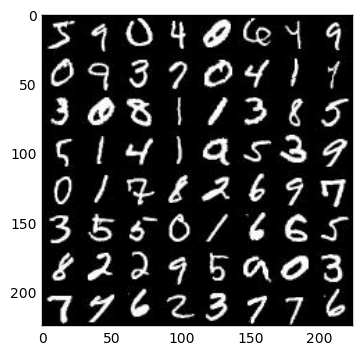

In [2]:
show_n_images = 64

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

# CelebA
The CelebFaces Attributes Dataset (CelebA) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations. You can view the first number of examples by changing show_n_images.

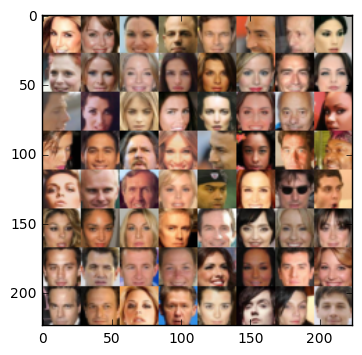

In [3]:
show_n_images = 64

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

# Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you. The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images. The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single color channel while the CelebA images have 3 color channels (RGB color channel).

# Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:

model_inputs
discriminator
generator
model_loss
model_opt
train
Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

sess = tf.Session()

from keras import backend as K
K.set_session(sess)

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1


C:\Users\sruja\Anaconda3_4.2\lib\site-packages\ipykernel\__main__.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.


# Input
Implement the model_inputs function to create TF Placeholders for the Neural Network. It should create the following placeholders:

Real input images placeholder with rank 4 using image_width, image_height, and image_channels.
Z input placeholder with rank 2 using z_dim.
Learning rate placeholder with rank 0.
Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    r_input = tf.placeholder(dtype=tf.float32, shape=(None, image_width, image_height, image_channels),
                              name='r_input')
    z_input = tf.placeholder(dtype=tf.float32,shape=(None, z_dim), name='z_input')
    lr = tf.placeholder(dtype=tf.float32, name='lr')

    return r_input, z_input, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


# Discriminator

Implement discriminator to create a discriminator neural network that discriminates on images. This function should be able to reuse the variables in the neural network. Use tf.variable_scope with a scope name of "discriminator" to allow the variables to be reused. The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False, alpha=0.2, dropout=0.8):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :param alpha: The leakage amount from the relus.
    :param dropout: How much dropout we want for trainning the discriminator
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        h1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        h1 = tf.maximum(alpha * h1, h1)
        
        h2 = tf.layers.conv2d(h1, 128, 5, strides=2, padding='same')
        h2 = tf.layers.batch_normalization(h2, training=True)
        h2 = tf.maximum(alpha * h2, h2)
        
        h3 = tf.layers.conv2d(h2, 256, 5, strides=2, padding='same')
        h3 = tf.layers.batch_normalization(h3, training=True)
        h3 = tf.maximum(alpha * h3, h3)

        flat = tf.reshape(h3, (-1, 4*4*256))
        dropout_layer = tf.layers.dropout(inputs=flat, rate=dropout)
        logits = tf.layers.dense(dropout_layer, 1)
        out = tf.sigmoid(logits)
        
    return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)


Tests Passed


# Generator
Implement generator to generate an image using z. This function should be able to reuse the variables in the neural network. Use tf.variable_scope with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x out_channel_dim images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :param alpha: The leakage amount from the relus.
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse= not is_train):
        h1 = tf.layers.dense(z, 3*3*512)
        h1 = tf.reshape(h1, (-1, 3, 3, 512))
        h1 = tf.layers.batch_normalization(h1, training=is_train)
        h1 = tf.maximum(alpha * h1, h1)
        # 3x3x512
        
        h2 = tf.layers.conv2d_transpose(h1, 256, kernel_size=4, strides=2, padding='same')
        h2 = tf.layers.batch_normalization(h2, training=is_train)
        h2 = tf.maximum(alpha * h2, h2)
        # 6x6x256
        
        h3 = tf.layers.conv2d_transpose(h2, 128, kernel_size=4, strides=2, padding='valid')
        h3 = tf.layers.batch_normalization(h3, training=is_train)
        h3 = tf.maximum(alpha * h3, h3)
        #14x14x128
        
        # Output layer
        logits = tf.layers.conv2d_transpose(h3, out_channel_dim, kernel_size=5,strides=2, padding='same')
        out = tf.tanh(logits)
        # 28x28x5
        
        return out

    


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


# Loss
Implement model_loss to build the GANs for training and calculate the loss. The function should return a tuple of (discriminator loss, generator loss). Use the following functions you implemented:

discriminator(images, reuse=False)
generator(z, out_channel_dim, is_train=True)

In [8]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2, dropout=0.8, smooth=0.1):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :param alpha: The leakage amount from the relus.
    :param dropout: How much dropout we want for trainning the discriminator
    :param smooth: How much do we want to smooth the discriminator so it is not that strong.
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim, is_train=True, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False, alpha=alpha, dropout=dropout)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha, dropout=dropout)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, 
                                                labels=tf.ones_like(d_model_real)*(1 - smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


# Optimization
Implement model_opt to create the optimization operations for the GANs. Use tf.trainable_variables to get all the trainable variables. Filter the variables with names that are in the discriminator and generator scope names. The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


# Neural Network Training
Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

# Train
Implement train to build and train the GANs. Use the following functions you implemented:

model_inputs(image_width, image_height, image_channels, z_dim)
model_loss(input_real, input_z, out_channel_dim)
model_opt(d_loss, g_loss, learning_rate, beta1)
Use the show_generator_output to show generator output while you train. Running show_generator_output for every batch will drastically increase training time and increase the size of the notebook. It's recommended to print the generator output every 100 batches.

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    print_step = 10
    show_step = 100
    leaky_alpha = 0.2
    dropout = 0.75
    images_to_show = 9
    losses =[]
    step = 0

    _, width, height, channels = data_shape
    
    r_input, z_input, lr = model_inputs(width, height, channels, z_dim)
    
    d_loss, g_loss = model_loss(r_input, z_input, channels, alpha=leaky_alpha)
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    print("Starting trainning")
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                step += 1
                batch_images = 2*batch_images
                # Random Noise as input
                z_batch = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                _ = sess.run(d_opt, feed_dict={r_input: batch_images, z_input: z_batch, lr: learning_rate})
                # Let the generator run twice, so that the discriminator does not converge that fast.
                _ = sess.run(g_opt, feed_dict={z_input: z_batch, r_input: batch_images, lr: learning_rate})
                
                if step % print_step == 0:
                    train_loss_d = d_loss.eval({z_input: z_batch, r_input: batch_images})
                    train_loss_g = g_loss.eval({z_input: z_batch})
                    
                    print("Step: {}:".format(step),
                          "Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    losses.append((train_loss_d, train_loss_g))
                
                if step % show_step == 0:
                    show_generator_output(sess, images_to_show, z_input, channels, data_image_mode)
    print("Finished with trainning")

# MNIST
Test your GANs architecture on MNIST. After 2 epochs, the GANs should be able to generate images that look like handwritten digits. Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Starting trainning
Step: 10: Epoch 1/2... Discriminator Loss: 1.0353... Generator Loss: 2.6746
Step: 20: Epoch 1/2... Discriminator Loss: 2.0777... Generator Loss: 6.4492
Step: 30: Epoch 1/2... Discriminator Loss: 1.5314... Generator Loss: 2.2580
Step: 40: Epoch 1/2... Discriminator Loss: 1.1029... Generator Loss: 0.9150
Step: 50: Epoch 1/2... Discriminator Loss: 0.6879... Generator Loss: 2.0883
Step: 60: Epoch 1/2... Discriminator Loss: 0.5809... Generator Loss: 1.8614
Step: 70: Epoch 1/2... Discriminator Loss: 1.5930... Generator Loss: 0.3941
Step: 80: Epoch 1/2... Discriminator Loss: 0.9985... Generator Loss: 1.1100
Step: 90: Epoch 1/2... Discriminator Loss: 1.8123... Generator Loss: 4.2338
Step: 100: Epoch 1/2... Discriminator Loss: 1.3045... Generator Loss: 0.6725


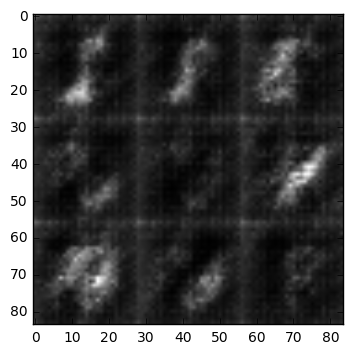

Step: 110: Epoch 1/2... Discriminator Loss: 1.3349... Generator Loss: 2.1819
Step: 120: Epoch 1/2... Discriminator Loss: 1.1049... Generator Loss: 0.8504
Step: 130: Epoch 1/2... Discriminator Loss: 0.8998... Generator Loss: 2.4150
Step: 140: Epoch 1/2... Discriminator Loss: 0.8858... Generator Loss: 1.1302
Step: 150: Epoch 1/2... Discriminator Loss: 0.9511... Generator Loss: 1.1091
Step: 160: Epoch 1/2... Discriminator Loss: 0.8822... Generator Loss: 1.3005
Step: 170: Epoch 1/2... Discriminator Loss: 2.3838... Generator Loss: 0.1674
Step: 180: Epoch 1/2... Discriminator Loss: 1.3800... Generator Loss: 0.5097
Step: 190: Epoch 1/2... Discriminator Loss: 1.1310... Generator Loss: 1.0724
Step: 200: Epoch 1/2... Discriminator Loss: 1.8091... Generator Loss: 0.3317


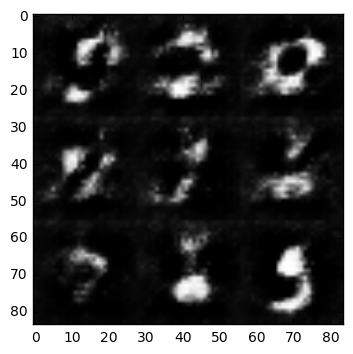

Step: 210: Epoch 1/2... Discriminator Loss: 1.7221... Generator Loss: 0.3438
Step: 220: Epoch 1/2... Discriminator Loss: 0.9847... Generator Loss: 1.5121
Step: 230: Epoch 1/2... Discriminator Loss: 0.8699... Generator Loss: 1.6010
Step: 240: Epoch 1/2... Discriminator Loss: 1.3351... Generator Loss: 0.5741
Step: 250: Epoch 1/2... Discriminator Loss: 1.1052... Generator Loss: 1.0278
Step: 260: Epoch 1/2... Discriminator Loss: 0.7687... Generator Loss: 2.0960
Step: 270: Epoch 1/2... Discriminator Loss: 1.1037... Generator Loss: 1.0192
Step: 280: Epoch 1/2... Discriminator Loss: 1.2371... Generator Loss: 0.7250
Step: 290: Epoch 1/2... Discriminator Loss: 0.9672... Generator Loss: 1.0662
Step: 300: Epoch 1/2... Discriminator Loss: 1.0091... Generator Loss: 0.8612


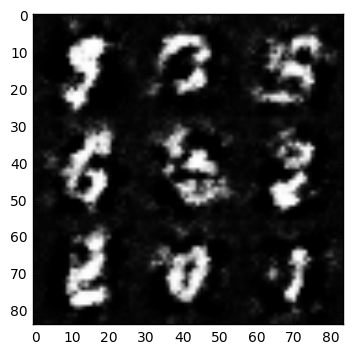

Step: 310: Epoch 1/2... Discriminator Loss: 0.9125... Generator Loss: 1.1011
Step: 320: Epoch 1/2... Discriminator Loss: 0.9799... Generator Loss: 1.0610
Step: 330: Epoch 1/2... Discriminator Loss: 1.1075... Generator Loss: 0.8180
Step: 340: Epoch 1/2... Discriminator Loss: 1.2213... Generator Loss: 0.6772
Step: 350: Epoch 1/2... Discriminator Loss: 0.9151... Generator Loss: 1.0541
Step: 360: Epoch 1/2... Discriminator Loss: 0.9630... Generator Loss: 1.4377
Step: 370: Epoch 1/2... Discriminator Loss: 1.1609... Generator Loss: 0.7000
Step: 380: Epoch 1/2... Discriminator Loss: 1.3316... Generator Loss: 0.5381
Step: 390: Epoch 1/2... Discriminator Loss: 0.8289... Generator Loss: 1.8884
Step: 400: Epoch 1/2... Discriminator Loss: 1.7848... Generator Loss: 0.3516


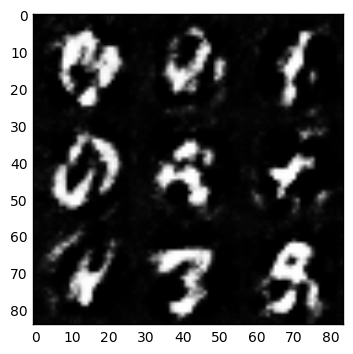

Step: 410: Epoch 1/2... Discriminator Loss: 1.1950... Generator Loss: 0.8285
Step: 420: Epoch 1/2... Discriminator Loss: 0.7833... Generator Loss: 1.4368
Step: 430: Epoch 1/2... Discriminator Loss: 1.0840... Generator Loss: 0.8186
Step: 440: Epoch 1/2... Discriminator Loss: 0.9443... Generator Loss: 1.1893
Step: 450: Epoch 1/2... Discriminator Loss: 0.9292... Generator Loss: 1.3059
Step: 460: Epoch 1/2... Discriminator Loss: 1.2097... Generator Loss: 0.6753
Step: 470: Epoch 1/2... Discriminator Loss: 0.8800... Generator Loss: 1.1619
Step: 480: Epoch 1/2... Discriminator Loss: 1.0446... Generator Loss: 2.1849
Step: 490: Epoch 1/2... Discriminator Loss: 1.3648... Generator Loss: 0.5710
Step: 500: Epoch 1/2... Discriminator Loss: 1.0712... Generator Loss: 0.7672


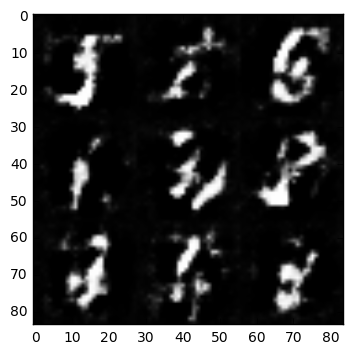

Step: 510: Epoch 1/2... Discriminator Loss: 0.9014... Generator Loss: 1.5613
Step: 520: Epoch 1/2... Discriminator Loss: 1.1018... Generator Loss: 1.9887
Step: 530: Epoch 1/2... Discriminator Loss: 0.8143... Generator Loss: 1.2928
Step: 540: Epoch 1/2... Discriminator Loss: 0.8721... Generator Loss: 1.9249
Step: 550: Epoch 1/2... Discriminator Loss: 0.9874... Generator Loss: 0.9851
Step: 560: Epoch 1/2... Discriminator Loss: 1.1306... Generator Loss: 2.2533
Step: 570: Epoch 1/2... Discriminator Loss: 0.9861... Generator Loss: 1.9219
Step: 580: Epoch 1/2... Discriminator Loss: 1.3909... Generator Loss: 0.5160
Step: 590: Epoch 1/2... Discriminator Loss: 1.0818... Generator Loss: 0.7699
Step: 600: Epoch 1/2... Discriminator Loss: 1.2101... Generator Loss: 0.6496


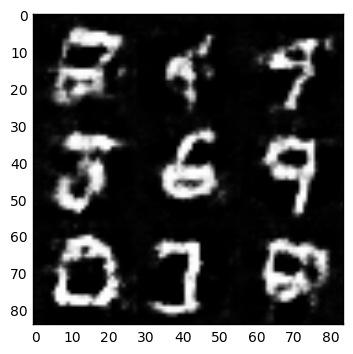

Step: 610: Epoch 1/2... Discriminator Loss: 0.8292... Generator Loss: 1.1522
Step: 620: Epoch 1/2... Discriminator Loss: 1.0041... Generator Loss: 1.7647
Step: 630: Epoch 1/2... Discriminator Loss: 1.1840... Generator Loss: 0.7071
Step: 640: Epoch 1/2... Discriminator Loss: 1.3719... Generator Loss: 0.5651
Step: 650: Epoch 1/2... Discriminator Loss: 1.4208... Generator Loss: 0.4821
Step: 660: Epoch 1/2... Discriminator Loss: 0.9423... Generator Loss: 0.9910
Step: 670: Epoch 1/2... Discriminator Loss: 1.1659... Generator Loss: 2.1055
Step: 680: Epoch 1/2... Discriminator Loss: 0.9476... Generator Loss: 1.8728
Step: 690: Epoch 1/2... Discriminator Loss: 1.1184... Generator Loss: 1.7666
Step: 700: Epoch 1/2... Discriminator Loss: 0.8169... Generator Loss: 1.2914


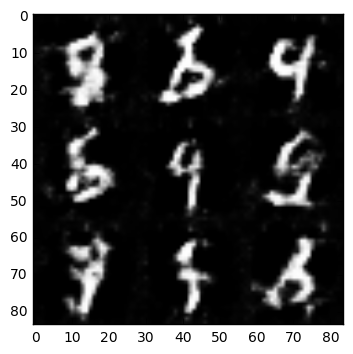

Step: 710: Epoch 1/2... Discriminator Loss: 1.3192... Generator Loss: 0.5507
Step: 720: Epoch 1/2... Discriminator Loss: 1.0594... Generator Loss: 0.8797
Step: 730: Epoch 1/2... Discriminator Loss: 0.8540... Generator Loss: 1.4774
Step: 740: Epoch 1/2... Discriminator Loss: 1.2603... Generator Loss: 0.6120
Step: 750: Epoch 1/2... Discriminator Loss: 1.0023... Generator Loss: 0.8555
Step: 760: Epoch 1/2... Discriminator Loss: 0.6908... Generator Loss: 1.7116
Step: 770: Epoch 1/2... Discriminator Loss: 0.8293... Generator Loss: 1.2531
Step: 780: Epoch 1/2... Discriminator Loss: 0.9707... Generator Loss: 1.0013
Step: 790: Epoch 1/2... Discriminator Loss: 1.2868... Generator Loss: 0.5889
Step: 800: Epoch 1/2... Discriminator Loss: 1.8946... Generator Loss: 0.2747


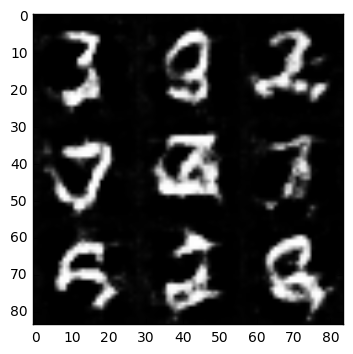

Step: 810: Epoch 1/2... Discriminator Loss: 0.8145... Generator Loss: 1.3696
Step: 820: Epoch 1/2... Discriminator Loss: 1.4734... Generator Loss: 0.4896
Step: 830: Epoch 1/2... Discriminator Loss: 2.0038... Generator Loss: 0.3310
Step: 840: Epoch 1/2... Discriminator Loss: 0.7365... Generator Loss: 1.7282
Step: 850: Epoch 1/2... Discriminator Loss: 0.8693... Generator Loss: 1.3827
Step: 860: Epoch 1/2... Discriminator Loss: 1.0960... Generator Loss: 0.7668
Step: 870: Epoch 1/2... Discriminator Loss: 1.0868... Generator Loss: 0.7912
Step: 880: Epoch 1/2... Discriminator Loss: 1.3148... Generator Loss: 0.5622
Step: 890: Epoch 1/2... Discriminator Loss: 1.2897... Generator Loss: 0.5824
Step: 900: Epoch 1/2... Discriminator Loss: 0.8359... Generator Loss: 1.1541


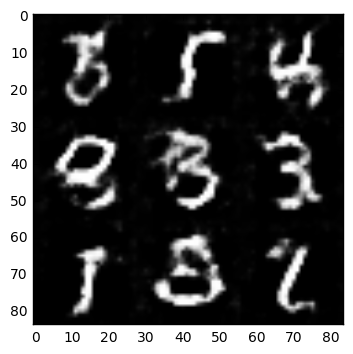

Step: 910: Epoch 1/2... Discriminator Loss: 1.1152... Generator Loss: 0.9083
Step: 920: Epoch 1/2... Discriminator Loss: 0.9033... Generator Loss: 1.2623
Step: 930: Epoch 1/2... Discriminator Loss: 1.3600... Generator Loss: 0.5221
Step: 940: Epoch 1/2... Discriminator Loss: 1.2023... Generator Loss: 0.7328
Step: 950: Epoch 1/2... Discriminator Loss: 0.9489... Generator Loss: 0.9455
Step: 960: Epoch 1/2... Discriminator Loss: 0.9027... Generator Loss: 1.4799
Step: 970: Epoch 1/2... Discriminator Loss: 1.2886... Generator Loss: 0.6212
Step: 980: Epoch 1/2... Discriminator Loss: 0.8297... Generator Loss: 1.2132
Step: 990: Epoch 1/2... Discriminator Loss: 0.9263... Generator Loss: 1.5494
Step: 1000: Epoch 1/2... Discriminator Loss: 1.5564... Generator Loss: 0.4049


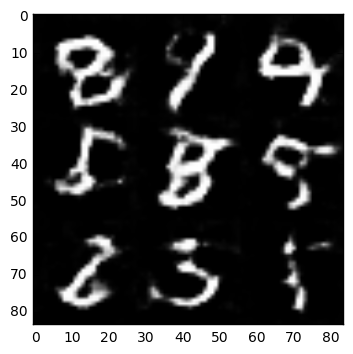

Step: 1010: Epoch 1/2... Discriminator Loss: 1.1901... Generator Loss: 0.6322
Step: 1020: Epoch 1/2... Discriminator Loss: 1.4041... Generator Loss: 0.5400
Step: 1030: Epoch 1/2... Discriminator Loss: 1.2439... Generator Loss: 0.6010
Step: 1040: Epoch 1/2... Discriminator Loss: 1.5796... Generator Loss: 0.3880
Step: 1050: Epoch 1/2... Discriminator Loss: 0.7671... Generator Loss: 1.2531
Step: 1060: Epoch 1/2... Discriminator Loss: 1.1476... Generator Loss: 0.7191
Step: 1070: Epoch 1/2... Discriminator Loss: 1.4153... Generator Loss: 0.4748
Step: 1080: Epoch 1/2... Discriminator Loss: 1.3357... Generator Loss: 0.5201
Step: 1090: Epoch 1/2... Discriminator Loss: 1.1514... Generator Loss: 0.7341
Step: 1100: Epoch 1/2... Discriminator Loss: 1.0271... Generator Loss: 0.7800


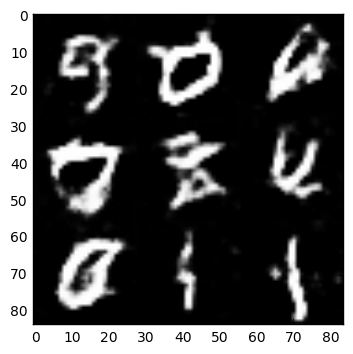

Step: 1110: Epoch 1/2... Discriminator Loss: 0.9471... Generator Loss: 1.1065
Step: 1120: Epoch 1/2... Discriminator Loss: 0.8813... Generator Loss: 1.6179
Step: 1130: Epoch 1/2... Discriminator Loss: 1.2344... Generator Loss: 0.6536
Step: 1140: Epoch 1/2... Discriminator Loss: 1.7352... Generator Loss: 0.3397
Step: 1150: Epoch 1/2... Discriminator Loss: 0.9600... Generator Loss: 1.5669
Step: 1160: Epoch 1/2... Discriminator Loss: 0.8228... Generator Loss: 1.3595
Step: 1170: Epoch 1/2... Discriminator Loss: 0.9576... Generator Loss: 1.2818
Step: 1180: Epoch 1/2... Discriminator Loss: 1.0151... Generator Loss: 1.1206
Step: 1190: Epoch 1/2... Discriminator Loss: 0.9448... Generator Loss: 1.5370
Step: 1200: Epoch 1/2... Discriminator Loss: 0.8635... Generator Loss: 2.0358


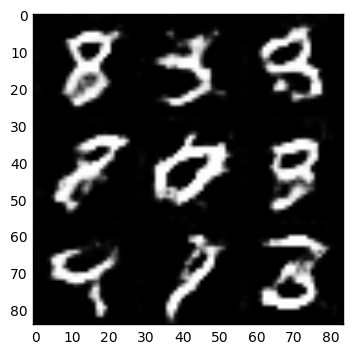

Step: 1210: Epoch 1/2... Discriminator Loss: 0.9401... Generator Loss: 1.0243
Step: 1220: Epoch 1/2... Discriminator Loss: 0.9064... Generator Loss: 1.1734
Step: 1230: Epoch 1/2... Discriminator Loss: 1.0965... Generator Loss: 0.7411
Step: 1240: Epoch 1/2... Discriminator Loss: 1.1429... Generator Loss: 0.7019
Step: 1250: Epoch 1/2... Discriminator Loss: 1.3601... Generator Loss: 0.5744
Step: 1260: Epoch 1/2... Discriminator Loss: 1.1760... Generator Loss: 0.6873
Step: 1270: Epoch 1/2... Discriminator Loss: 1.0573... Generator Loss: 0.8602
Step: 1280: Epoch 1/2... Discriminator Loss: 1.5846... Generator Loss: 0.5642
Step: 1290: Epoch 1/2... Discriminator Loss: 0.9866... Generator Loss: 1.1238
Step: 1300: Epoch 1/2... Discriminator Loss: 1.1863... Generator Loss: 0.6622


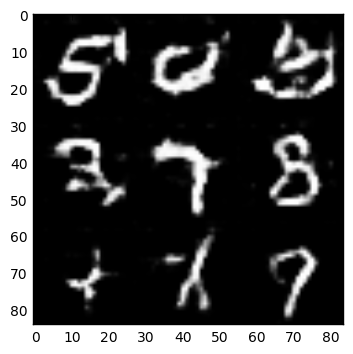

Step: 1310: Epoch 1/2... Discriminator Loss: 0.7874... Generator Loss: 2.4908
Step: 1320: Epoch 1/2... Discriminator Loss: 1.4518... Generator Loss: 0.5140
Step: 1330: Epoch 1/2... Discriminator Loss: 1.1409... Generator Loss: 0.7287
Step: 1340: Epoch 1/2... Discriminator Loss: 0.7444... Generator Loss: 1.5611
Step: 1350: Epoch 1/2... Discriminator Loss: 1.8222... Generator Loss: 0.4070
Step: 1360: Epoch 1/2... Discriminator Loss: 1.6345... Generator Loss: 0.4553
Step: 1370: Epoch 1/2... Discriminator Loss: 1.2906... Generator Loss: 0.5607
Step: 1380: Epoch 1/2... Discriminator Loss: 0.8492... Generator Loss: 1.1749
Step: 1390: Epoch 1/2... Discriminator Loss: 0.8008... Generator Loss: 1.4695
Step: 1400: Epoch 1/2... Discriminator Loss: 1.0829... Generator Loss: 0.8005


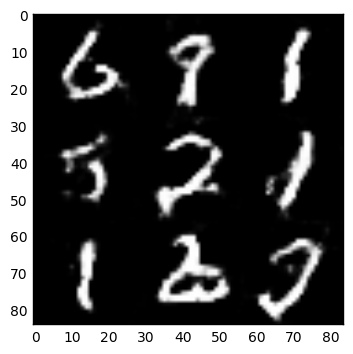

Step: 1410: Epoch 1/2... Discriminator Loss: 0.9312... Generator Loss: 0.9121
Step: 1420: Epoch 1/2... Discriminator Loss: 1.4028... Generator Loss: 2.4845
Step: 1430: Epoch 1/2... Discriminator Loss: 0.9338... Generator Loss: 1.0664
Step: 1440: Epoch 1/2... Discriminator Loss: 1.1965... Generator Loss: 0.6588
Step: 1450: Epoch 1/2... Discriminator Loss: 0.7599... Generator Loss: 1.3699
Step: 1460: Epoch 1/2... Discriminator Loss: 0.7220... Generator Loss: 1.4096
Step: 1470: Epoch 1/2... Discriminator Loss: 0.8743... Generator Loss: 1.0113
Step: 1480: Epoch 1/2... Discriminator Loss: 0.7484... Generator Loss: 1.3666
Step: 1490: Epoch 1/2... Discriminator Loss: 1.3434... Generator Loss: 0.5395
Step: 1500: Epoch 1/2... Discriminator Loss: 0.6935... Generator Loss: 1.5558


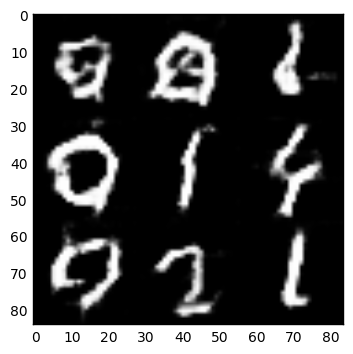

Step: 1510: Epoch 1/2... Discriminator Loss: 1.3638... Generator Loss: 0.5231
Step: 1520: Epoch 1/2... Discriminator Loss: 0.8371... Generator Loss: 1.1893
Step: 1530: Epoch 1/2... Discriminator Loss: 1.1665... Generator Loss: 0.7005
Step: 1540: Epoch 1/2... Discriminator Loss: 0.7559... Generator Loss: 1.2222
Step: 1550: Epoch 1/2... Discriminator Loss: 1.0355... Generator Loss: 0.8609
Step: 1560: Epoch 1/2... Discriminator Loss: 1.0189... Generator Loss: 0.8498
Step: 1570: Epoch 1/2... Discriminator Loss: 0.8728... Generator Loss: 1.8411
Step: 1580: Epoch 1/2... Discriminator Loss: 0.9114... Generator Loss: 1.0091
Step: 1590: Epoch 1/2... Discriminator Loss: 2.0741... Generator Loss: 0.2374
Step: 1600: Epoch 1/2... Discriminator Loss: 1.5123... Generator Loss: 0.4288


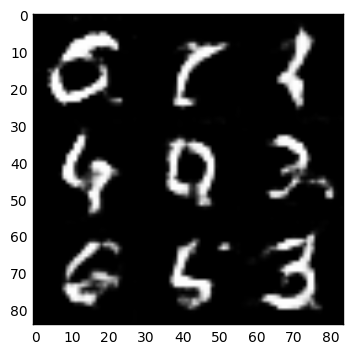

Step: 1610: Epoch 1/2... Discriminator Loss: 1.1580... Generator Loss: 0.6292
Step: 1620: Epoch 1/2... Discriminator Loss: 1.1856... Generator Loss: 0.6111
Step: 1630: Epoch 1/2... Discriminator Loss: 0.9103... Generator Loss: 0.9916
Step: 1640: Epoch 1/2... Discriminator Loss: 1.2218... Generator Loss: 0.6358
Step: 1650: Epoch 1/2... Discriminator Loss: 0.6505... Generator Loss: 1.6273
Step: 1660: Epoch 1/2... Discriminator Loss: 0.6737... Generator Loss: 1.4476
Step: 1670: Epoch 1/2... Discriminator Loss: 0.8981... Generator Loss: 1.2519
Step: 1680: Epoch 1/2... Discriminator Loss: 0.7051... Generator Loss: 1.4096
Step: 1690: Epoch 1/2... Discriminator Loss: 2.7231... Generator Loss: 0.1935
Step: 1700: Epoch 1/2... Discriminator Loss: 0.6358... Generator Loss: 1.6002


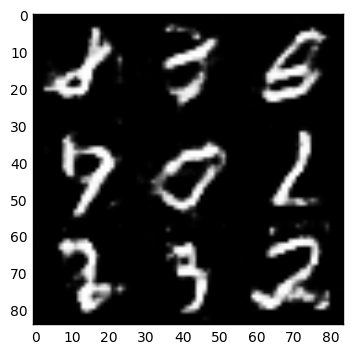

Step: 1710: Epoch 1/2... Discriminator Loss: 1.2860... Generator Loss: 0.7131
Step: 1720: Epoch 1/2... Discriminator Loss: 0.6386... Generator Loss: 2.3131
Step: 1730: Epoch 1/2... Discriminator Loss: 1.1317... Generator Loss: 0.7467
Step: 1740: Epoch 1/2... Discriminator Loss: 0.8385... Generator Loss: 1.7755
Step: 1750: Epoch 1/2... Discriminator Loss: 0.7880... Generator Loss: 1.1969
Step: 1760: Epoch 1/2... Discriminator Loss: 1.1852... Generator Loss: 0.6351
Step: 1770: Epoch 1/2... Discriminator Loss: 1.3224... Generator Loss: 2.4692
Step: 1780: Epoch 1/2... Discriminator Loss: 0.8526... Generator Loss: 1.0551
Step: 1790: Epoch 1/2... Discriminator Loss: 0.6805... Generator Loss: 1.4767
Step: 1800: Epoch 1/2... Discriminator Loss: 0.6607... Generator Loss: 1.4473


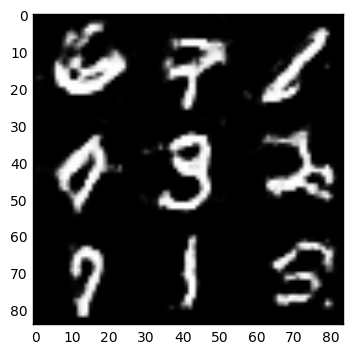

Step: 1810: Epoch 1/2... Discriminator Loss: 0.7973... Generator Loss: 1.2768
Step: 1820: Epoch 1/2... Discriminator Loss: 0.8506... Generator Loss: 1.0603
Step: 1830: Epoch 1/2... Discriminator Loss: 1.1916... Generator Loss: 0.6933
Step: 1840: Epoch 1/2... Discriminator Loss: 0.7664... Generator Loss: 1.3231
Step: 1850: Epoch 1/2... Discriminator Loss: 1.1512... Generator Loss: 0.7042
Step: 1860: Epoch 1/2... Discriminator Loss: 1.6153... Generator Loss: 0.4141
Step: 1870: Epoch 1/2... Discriminator Loss: 0.9465... Generator Loss: 0.8735
Step: 1880: Epoch 2/2... Discriminator Loss: 0.7648... Generator Loss: 1.2735
Step: 1890: Epoch 2/2... Discriminator Loss: 0.6725... Generator Loss: 1.4185
Step: 1900: Epoch 2/2... Discriminator Loss: 0.7378... Generator Loss: 1.3638


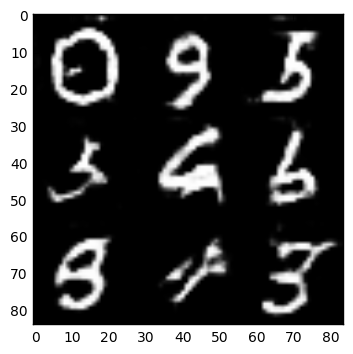

Step: 1910: Epoch 2/2... Discriminator Loss: 0.9219... Generator Loss: 1.0107
Step: 1920: Epoch 2/2... Discriminator Loss: 0.7183... Generator Loss: 1.2745
Step: 1930: Epoch 2/2... Discriminator Loss: 0.7973... Generator Loss: 1.3669
Step: 1940: Epoch 2/2... Discriminator Loss: 1.1384... Generator Loss: 2.0749
Step: 1950: Epoch 2/2... Discriminator Loss: 0.8002... Generator Loss: 1.2415
Step: 1960: Epoch 2/2... Discriminator Loss: 0.8966... Generator Loss: 0.9924
Step: 1970: Epoch 2/2... Discriminator Loss: 0.9395... Generator Loss: 0.9215
Step: 1980: Epoch 2/2... Discriminator Loss: 1.2254... Generator Loss: 0.6102
Step: 1990: Epoch 2/2... Discriminator Loss: 0.7566... Generator Loss: 1.4799
Step: 2000: Epoch 2/2... Discriminator Loss: 0.7971... Generator Loss: 1.8459


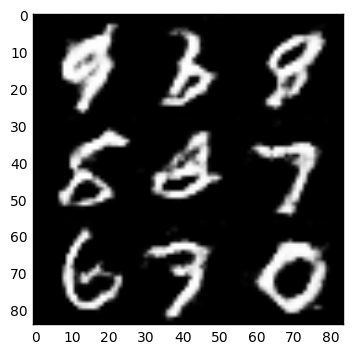

Step: 2010: Epoch 2/2... Discriminator Loss: 0.6954... Generator Loss: 1.4496
Step: 2020: Epoch 2/2... Discriminator Loss: 0.6628... Generator Loss: 1.5188
Step: 2030: Epoch 2/2... Discriminator Loss: 0.9677... Generator Loss: 0.8806
Step: 2040: Epoch 2/2... Discriminator Loss: 0.6246... Generator Loss: 1.7310
Step: 2050: Epoch 2/2... Discriminator Loss: 0.7080... Generator Loss: 1.6949
Step: 2060: Epoch 2/2... Discriminator Loss: 0.7491... Generator Loss: 1.4772
Step: 2070: Epoch 2/2... Discriminator Loss: 0.8060... Generator Loss: 1.5211
Step: 2080: Epoch 2/2... Discriminator Loss: 1.0480... Generator Loss: 0.7377
Step: 2090: Epoch 2/2... Discriminator Loss: 0.8087... Generator Loss: 1.1980
Step: 2100: Epoch 2/2... Discriminator Loss: 0.6393... Generator Loss: 1.6131


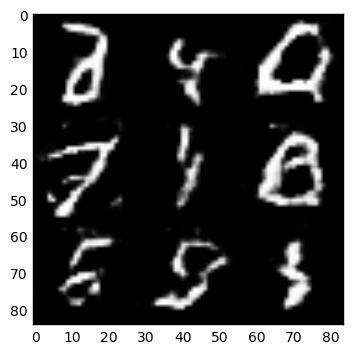

Step: 2110: Epoch 2/2... Discriminator Loss: 1.4122... Generator Loss: 0.4947
Step: 2120: Epoch 2/2... Discriminator Loss: 0.8571... Generator Loss: 1.8580
Step: 2130: Epoch 2/2... Discriminator Loss: 0.7300... Generator Loss: 1.3357
Step: 2140: Epoch 2/2... Discriminator Loss: 2.2529... Generator Loss: 0.3638
Step: 2150: Epoch 2/2... Discriminator Loss: 0.9067... Generator Loss: 1.0129
Step: 2160: Epoch 2/2... Discriminator Loss: 1.5915... Generator Loss: 0.4287
Step: 2170: Epoch 2/2... Discriminator Loss: 1.7095... Generator Loss: 0.6504
Step: 2180: Epoch 2/2... Discriminator Loss: 0.7988... Generator Loss: 1.1810
Step: 2190: Epoch 2/2... Discriminator Loss: 0.5358... Generator Loss: 1.9411
Step: 2200: Epoch 2/2... Discriminator Loss: 0.6899... Generator Loss: 1.6673


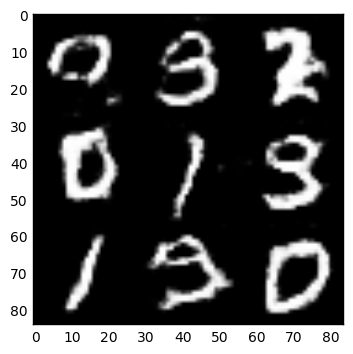

Step: 2210: Epoch 2/2... Discriminator Loss: 0.8644... Generator Loss: 1.0053
Step: 2220: Epoch 2/2... Discriminator Loss: 0.7760... Generator Loss: 1.2485
Step: 2230: Epoch 2/2... Discriminator Loss: 0.8894... Generator Loss: 0.9895
Step: 2240: Epoch 2/2... Discriminator Loss: 0.6617... Generator Loss: 1.9967
Step: 2250: Epoch 2/2... Discriminator Loss: 0.9891... Generator Loss: 0.9848
Step: 2260: Epoch 2/2... Discriminator Loss: 0.7056... Generator Loss: 1.5102
Step: 2270: Epoch 2/2... Discriminator Loss: 0.7008... Generator Loss: 1.8130
Step: 2280: Epoch 2/2... Discriminator Loss: 0.6063... Generator Loss: 1.7174
Step: 2290: Epoch 2/2... Discriminator Loss: 0.8801... Generator Loss: 1.0750
Step: 2300: Epoch 2/2... Discriminator Loss: 0.6373... Generator Loss: 2.6552


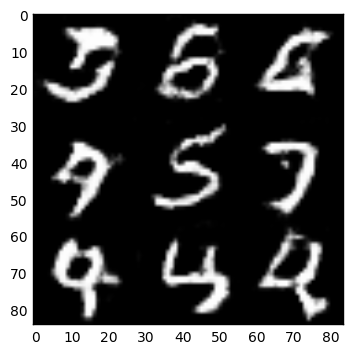

Step: 2310: Epoch 2/2... Discriminator Loss: 0.7480... Generator Loss: 1.2799
Step: 2320: Epoch 2/2... Discriminator Loss: 1.0584... Generator Loss: 0.7908
Step: 2330: Epoch 2/2... Discriminator Loss: 1.7409... Generator Loss: 0.3747
Step: 2340: Epoch 2/2... Discriminator Loss: 0.9020... Generator Loss: 1.0547
Step: 2350: Epoch 2/2... Discriminator Loss: 0.6570... Generator Loss: 1.4999
Step: 2360: Epoch 2/2... Discriminator Loss: 0.8518... Generator Loss: 1.1034
Step: 2370: Epoch 2/2... Discriminator Loss: 0.7526... Generator Loss: 1.3056
Step: 2380: Epoch 2/2... Discriminator Loss: 1.1301... Generator Loss: 0.7004
Step: 2390: Epoch 2/2... Discriminator Loss: 1.7561... Generator Loss: 3.1837
Step: 2400: Epoch 2/2... Discriminator Loss: 0.8764... Generator Loss: 1.2812


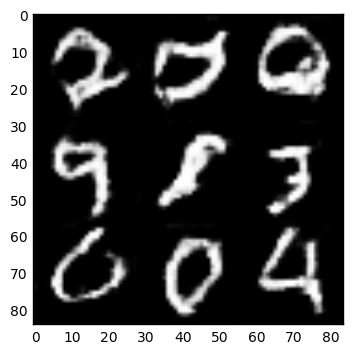

Step: 2410: Epoch 2/2... Discriminator Loss: 0.7853... Generator Loss: 1.3496
Step: 2420: Epoch 2/2... Discriminator Loss: 0.7004... Generator Loss: 1.5145
Step: 2430: Epoch 2/2... Discriminator Loss: 0.6960... Generator Loss: 1.4226
Step: 2440: Epoch 2/2... Discriminator Loss: 0.8822... Generator Loss: 1.0005
Step: 2450: Epoch 2/2... Discriminator Loss: 0.7483... Generator Loss: 2.2131
Step: 2460: Epoch 2/2... Discriminator Loss: 0.6318... Generator Loss: 1.7710
Step: 2470: Epoch 2/2... Discriminator Loss: 1.1872... Generator Loss: 0.7191
Step: 2480: Epoch 2/2... Discriminator Loss: 0.7697... Generator Loss: 1.3040
Step: 2490: Epoch 2/2... Discriminator Loss: 0.8843... Generator Loss: 1.0237
Step: 2500: Epoch 2/2... Discriminator Loss: 0.8693... Generator Loss: 1.0714


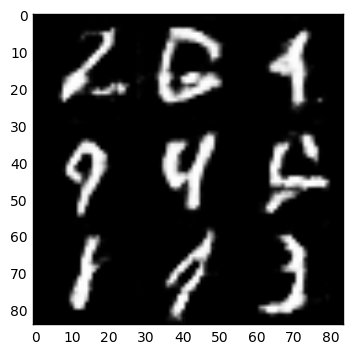

Step: 2510: Epoch 2/2... Discriminator Loss: 1.1293... Generator Loss: 0.6844
Step: 2520: Epoch 2/2... Discriminator Loss: 0.7663... Generator Loss: 1.3945
Step: 2530: Epoch 2/2... Discriminator Loss: 0.9014... Generator Loss: 1.0069
Step: 2540: Epoch 2/2... Discriminator Loss: 0.8136... Generator Loss: 1.1497
Step: 2550: Epoch 2/2... Discriminator Loss: 1.5669... Generator Loss: 0.4482
Step: 2560: Epoch 2/2... Discriminator Loss: 0.8432... Generator Loss: 1.1152
Step: 2570: Epoch 2/2... Discriminator Loss: 0.6534... Generator Loss: 1.5598
Step: 2580: Epoch 2/2... Discriminator Loss: 0.9227... Generator Loss: 0.9788
Step: 2590: Epoch 2/2... Discriminator Loss: 0.9402... Generator Loss: 0.9259
Step: 2600: Epoch 2/2... Discriminator Loss: 0.6913... Generator Loss: 1.4019


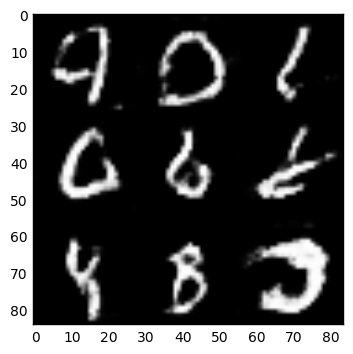

Step: 2610: Epoch 2/2... Discriminator Loss: 0.8907... Generator Loss: 0.9509
Step: 2620: Epoch 2/2... Discriminator Loss: 0.5523... Generator Loss: 2.3889
Step: 2630: Epoch 2/2... Discriminator Loss: 0.6101... Generator Loss: 1.6058
Step: 2640: Epoch 2/2... Discriminator Loss: 2.8839... Generator Loss: 0.1933
Step: 2650: Epoch 2/2... Discriminator Loss: 0.7288... Generator Loss: 1.4826
Step: 2660: Epoch 2/2... Discriminator Loss: 0.7018... Generator Loss: 1.5179
Step: 2670: Epoch 2/2... Discriminator Loss: 0.6773... Generator Loss: 1.5816
Step: 2680: Epoch 2/2... Discriminator Loss: 0.8647... Generator Loss: 1.6560
Step: 2690: Epoch 2/2... Discriminator Loss: 0.5096... Generator Loss: 2.1260
Step: 2700: Epoch 2/2... Discriminator Loss: 0.8874... Generator Loss: 1.0615


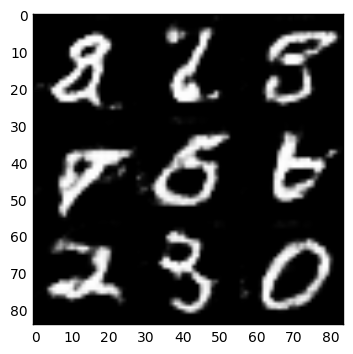

Step: 2710: Epoch 2/2... Discriminator Loss: 0.6689... Generator Loss: 1.4185
Step: 2720: Epoch 2/2... Discriminator Loss: 1.1054... Generator Loss: 0.7439
Step: 2730: Epoch 2/2... Discriminator Loss: 2.2860... Generator Loss: 0.2204
Step: 2740: Epoch 2/2... Discriminator Loss: 0.8024... Generator Loss: 1.4859
Step: 2750: Epoch 2/2... Discriminator Loss: 1.3290... Generator Loss: 0.6050
Step: 2760: Epoch 2/2... Discriminator Loss: 0.8797... Generator Loss: 1.0150
Step: 2770: Epoch 2/2... Discriminator Loss: 0.7169... Generator Loss: 1.6828
Step: 2780: Epoch 2/2... Discriminator Loss: 0.6243... Generator Loss: 1.8449
Step: 2790: Epoch 2/2... Discriminator Loss: 1.4940... Generator Loss: 0.4985
Step: 2800: Epoch 2/2... Discriminator Loss: 0.7969... Generator Loss: 1.2660


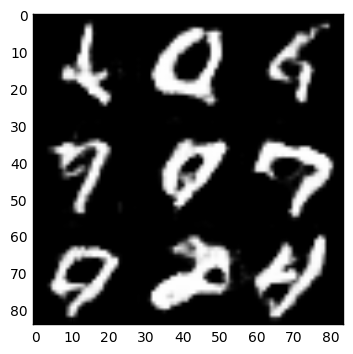

Step: 2810: Epoch 2/2... Discriminator Loss: 0.7031... Generator Loss: 2.1846
Step: 2820: Epoch 2/2... Discriminator Loss: 0.8388... Generator Loss: 1.5996
Step: 2830: Epoch 2/2... Discriminator Loss: 0.6241... Generator Loss: 1.9576
Step: 2840: Epoch 2/2... Discriminator Loss: 0.9469... Generator Loss: 0.9338
Step: 2850: Epoch 2/2... Discriminator Loss: 0.6649... Generator Loss: 1.5443
Step: 2860: Epoch 2/2... Discriminator Loss: 0.8588... Generator Loss: 1.0675
Step: 2870: Epoch 2/2... Discriminator Loss: 0.6250... Generator Loss: 1.6435
Step: 2880: Epoch 2/2... Discriminator Loss: 0.6279... Generator Loss: 1.5677
Step: 2890: Epoch 2/2... Discriminator Loss: 0.6134... Generator Loss: 1.5977
Step: 2900: Epoch 2/2... Discriminator Loss: 0.6577... Generator Loss: 1.4634


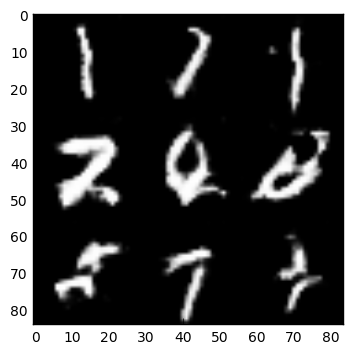

Step: 2910: Epoch 2/2... Discriminator Loss: 1.3224... Generator Loss: 0.7258
Step: 2920: Epoch 2/2... Discriminator Loss: 0.7483... Generator Loss: 1.4665
Step: 2930: Epoch 2/2... Discriminator Loss: 1.0061... Generator Loss: 0.9353
Step: 2940: Epoch 2/2... Discriminator Loss: 0.9126... Generator Loss: 0.9306
Step: 2950: Epoch 2/2... Discriminator Loss: 0.7307... Generator Loss: 1.2181
Step: 2960: Epoch 2/2... Discriminator Loss: 0.6974... Generator Loss: 1.5358
Step: 2970: Epoch 2/2... Discriminator Loss: 0.5394... Generator Loss: 2.0471
Step: 2980: Epoch 2/2... Discriminator Loss: 0.9070... Generator Loss: 1.0684
Step: 2990: Epoch 2/2... Discriminator Loss: 0.6569... Generator Loss: 1.7318
Step: 3000: Epoch 2/2... Discriminator Loss: 0.7032... Generator Loss: 1.8685


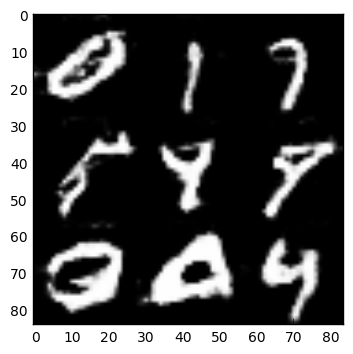

Step: 3010: Epoch 2/2... Discriminator Loss: 1.0653... Generator Loss: 0.9252
Step: 3020: Epoch 2/2... Discriminator Loss: 0.6695... Generator Loss: 1.7410
Step: 3030: Epoch 2/2... Discriminator Loss: 0.6186... Generator Loss: 1.5862
Step: 3040: Epoch 2/2... Discriminator Loss: 0.9212... Generator Loss: 1.0043
Step: 3050: Epoch 2/2... Discriminator Loss: 0.6415... Generator Loss: 1.4855
Step: 3060: Epoch 2/2... Discriminator Loss: 0.5882... Generator Loss: 1.8692
Step: 3070: Epoch 2/2... Discriminator Loss: 0.6873... Generator Loss: 1.3422
Step: 3080: Epoch 2/2... Discriminator Loss: 0.8324... Generator Loss: 3.3763
Step: 3090: Epoch 2/2... Discriminator Loss: 2.0820... Generator Loss: 0.3592
Step: 3100: Epoch 2/2... Discriminator Loss: 0.9239... Generator Loss: 1.0539


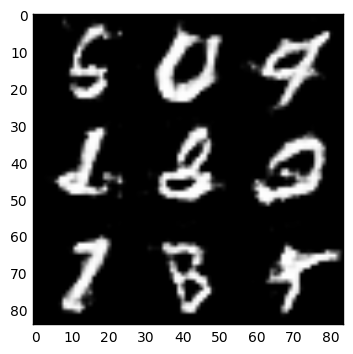

Step: 3110: Epoch 2/2... Discriminator Loss: 0.5820... Generator Loss: 1.9336
Step: 3120: Epoch 2/2... Discriminator Loss: 1.0477... Generator Loss: 0.7644
Step: 3130: Epoch 2/2... Discriminator Loss: 0.6872... Generator Loss: 1.5104
Step: 3140: Epoch 2/2... Discriminator Loss: 1.7522... Generator Loss: 0.4022
Step: 3150: Epoch 2/2... Discriminator Loss: 1.5604... Generator Loss: 0.4789
Step: 3160: Epoch 2/2... Discriminator Loss: 2.5650... Generator Loss: 0.2363
Step: 3170: Epoch 2/2... Discriminator Loss: 1.0213... Generator Loss: 0.8959
Step: 3180: Epoch 2/2... Discriminator Loss: 0.9709... Generator Loss: 0.8864
Step: 3190: Epoch 2/2... Discriminator Loss: 0.7434... Generator Loss: 1.2352
Step: 3200: Epoch 2/2... Discriminator Loss: 0.6513... Generator Loss: 1.6365


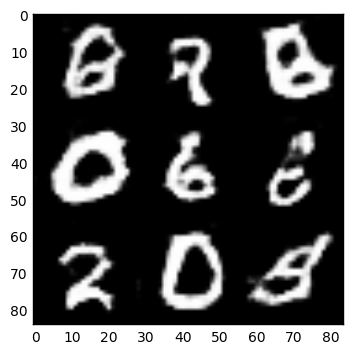

Step: 3210: Epoch 2/2... Discriminator Loss: 0.7591... Generator Loss: 1.2362
Step: 3220: Epoch 2/2... Discriminator Loss: 1.0382... Generator Loss: 0.7525
Step: 3230: Epoch 2/2... Discriminator Loss: 0.7848... Generator Loss: 1.1386
Step: 3240: Epoch 2/2... Discriminator Loss: 0.5382... Generator Loss: 2.2721
Step: 3250: Epoch 2/2... Discriminator Loss: 0.6753... Generator Loss: 1.4566
Step: 3260: Epoch 2/2... Discriminator Loss: 0.9474... Generator Loss: 0.9922
Step: 3270: Epoch 2/2... Discriminator Loss: 0.6947... Generator Loss: 1.3994
Step: 3280: Epoch 2/2... Discriminator Loss: 0.9122... Generator Loss: 1.6611
Step: 3290: Epoch 2/2... Discriminator Loss: 1.3944... Generator Loss: 0.7176
Step: 3300: Epoch 2/2... Discriminator Loss: 0.8287... Generator Loss: 1.1467


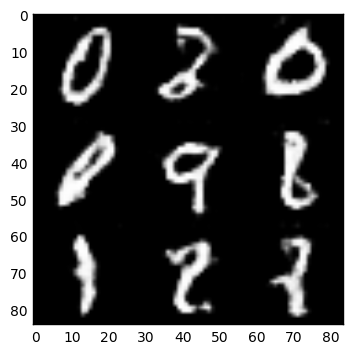

Step: 3310: Epoch 2/2... Discriminator Loss: 0.5803... Generator Loss: 2.1748
Step: 3320: Epoch 2/2... Discriminator Loss: 0.5650... Generator Loss: 1.8510
Step: 3330: Epoch 2/2... Discriminator Loss: 0.6510... Generator Loss: 2.0638
Step: 3340: Epoch 2/2... Discriminator Loss: 0.9527... Generator Loss: 2.8765
Step: 3350: Epoch 2/2... Discriminator Loss: 0.9559... Generator Loss: 1.2679
Step: 3360: Epoch 2/2... Discriminator Loss: 0.5643... Generator Loss: 2.4891
Step: 3370: Epoch 2/2... Discriminator Loss: 1.2688... Generator Loss: 0.6472
Step: 3380: Epoch 2/2... Discriminator Loss: 0.7126... Generator Loss: 1.3543
Step: 3390: Epoch 2/2... Discriminator Loss: 0.4816... Generator Loss: 2.4312
Step: 3400: Epoch 2/2... Discriminator Loss: 1.0356... Generator Loss: 0.8105


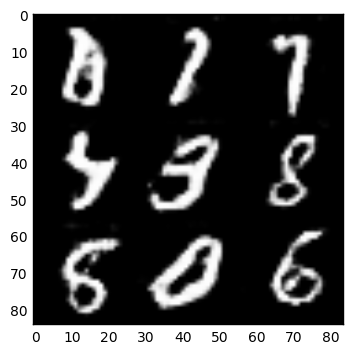

Step: 3410: Epoch 2/2... Discriminator Loss: 0.8684... Generator Loss: 1.0384
Step: 3420: Epoch 2/2... Discriminator Loss: 1.0282... Generator Loss: 0.9731
Step: 3430: Epoch 2/2... Discriminator Loss: 2.3080... Generator Loss: 0.2541
Step: 3440: Epoch 2/2... Discriminator Loss: 0.7650... Generator Loss: 1.2971
Step: 3450: Epoch 2/2... Discriminator Loss: 0.8735... Generator Loss: 1.0914
Step: 3460: Epoch 2/2... Discriminator Loss: 0.6714... Generator Loss: 1.4887
Step: 3470: Epoch 2/2... Discriminator Loss: 0.6342... Generator Loss: 1.6087
Step: 3480: Epoch 2/2... Discriminator Loss: 0.5832... Generator Loss: 1.7841
Step: 3490: Epoch 2/2... Discriminator Loss: 0.7834... Generator Loss: 2.9949
Step: 3500: Epoch 2/2... Discriminator Loss: 1.7462... Generator Loss: 0.5099


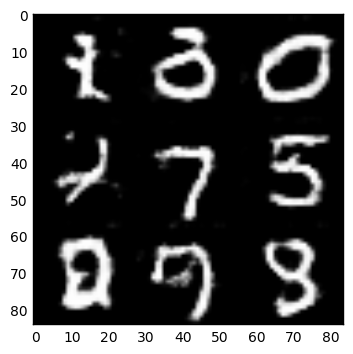

Step: 3510: Epoch 2/2... Discriminator Loss: 0.7091... Generator Loss: 1.5111
Step: 3520: Epoch 2/2... Discriminator Loss: 0.7789... Generator Loss: 1.1598
Step: 3530: Epoch 2/2... Discriminator Loss: 0.6240... Generator Loss: 1.5937
Step: 3540: Epoch 2/2... Discriminator Loss: 0.7006... Generator Loss: 1.7598
Step: 3550: Epoch 2/2... Discriminator Loss: 0.7146... Generator Loss: 1.3044
Step: 3560: Epoch 2/2... Discriminator Loss: 0.5977... Generator Loss: 1.6801
Step: 3570: Epoch 2/2... Discriminator Loss: 0.8402... Generator Loss: 1.0510
Step: 3580: Epoch 2/2... Discriminator Loss: 0.6655... Generator Loss: 1.6179
Step: 3590: Epoch 2/2... Discriminator Loss: 1.5567... Generator Loss: 0.4947
Step: 3600: Epoch 2/2... Discriminator Loss: 0.6346... Generator Loss: 2.1270


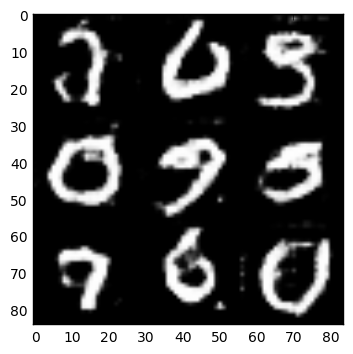

Step: 3610: Epoch 2/2... Discriminator Loss: 0.4556... Generator Loss: 2.5633
Step: 3620: Epoch 2/2... Discriminator Loss: 0.7514... Generator Loss: 2.3817
Step: 3630: Epoch 2/2... Discriminator Loss: 0.5800... Generator Loss: 1.7509
Step: 3640: Epoch 2/2... Discriminator Loss: 1.4228... Generator Loss: 0.5591
Step: 3650: Epoch 2/2... Discriminator Loss: 0.8023... Generator Loss: 1.1549
Step: 3660: Epoch 2/2... Discriminator Loss: 0.9575... Generator Loss: 0.8541
Step: 3670: Epoch 2/2... Discriminator Loss: 0.6403... Generator Loss: 1.7530
Step: 3680: Epoch 2/2... Discriminator Loss: 0.8484... Generator Loss: 1.0220
Step: 3690: Epoch 2/2... Discriminator Loss: 0.9912... Generator Loss: 0.9634
Step: 3700: Epoch 2/2... Discriminator Loss: 0.7102... Generator Loss: 1.8203


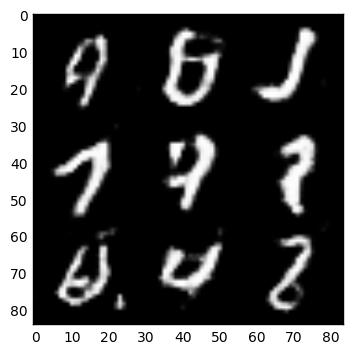

Step: 3710: Epoch 2/2... Discriminator Loss: 0.7346... Generator Loss: 3.2504
Step: 3720: Epoch 2/2... Discriminator Loss: 0.6184... Generator Loss: 1.7428
Step: 3730: Epoch 2/2... Discriminator Loss: 0.7493... Generator Loss: 1.2953
Step: 3740: Epoch 2/2... Discriminator Loss: 0.6339... Generator Loss: 1.6777
Step: 3750: Epoch 2/2... Discriminator Loss: 0.6144... Generator Loss: 1.5857
Finished with trainning


In [13]:
batch_size = 32
z_dim = 200
learning_rate = 0.0002
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

# CelebA
Run your GANs on CelebA. It will take around 20 minutes on the average GPU to run one epoch. You can run the whole epoch or stop when it starts to generate realistic faces.

Starting trainning
Step: 10: Epoch 1/1... Discriminator Loss: 1.1655... Generator Loss: 0.7361
Step: 20: Epoch 1/1... Discriminator Loss: 0.7045... Generator Loss: 3.5792
Step: 30: Epoch 1/1... Discriminator Loss: 1.9028... Generator Loss: 0.2912
Step: 40: Epoch 1/1... Discriminator Loss: 0.6225... Generator Loss: 2.5892
Step: 50: Epoch 1/1... Discriminator Loss: 2.0854... Generator Loss: 11.8957
Step: 60: Epoch 1/1... Discriminator Loss: 0.4580... Generator Loss: 5.5669
Step: 70: Epoch 1/1... Discriminator Loss: 0.5405... Generator Loss: 3.0047
Step: 80: Epoch 1/1... Discriminator Loss: 0.6625... Generator Loss: 3.1912
Step: 90: Epoch 1/1... Discriminator Loss: 1.3607... Generator Loss: 0.6089
Step: 100: Epoch 1/1... Discriminator Loss: 0.9667... Generator Loss: 1.3696


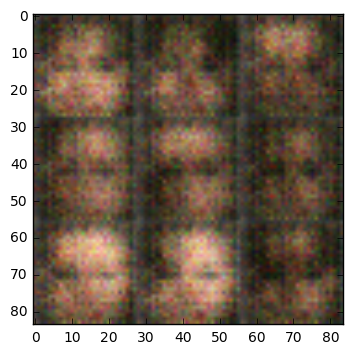

Step: 110: Epoch 1/1... Discriminator Loss: 0.8399... Generator Loss: 1.3843
Step: 120: Epoch 1/1... Discriminator Loss: 0.7879... Generator Loss: 1.2904
Step: 130: Epoch 1/1... Discriminator Loss: 1.0860... Generator Loss: 1.0240
Step: 140: Epoch 1/1... Discriminator Loss: 2.1766... Generator Loss: 0.2462
Step: 150: Epoch 1/1... Discriminator Loss: 0.8178... Generator Loss: 3.7516
Step: 160: Epoch 1/1... Discriminator Loss: 1.1968... Generator Loss: 0.6813
Step: 170: Epoch 1/1... Discriminator Loss: 1.0471... Generator Loss: 0.8154
Step: 180: Epoch 1/1... Discriminator Loss: 0.7496... Generator Loss: 2.2830
Step: 190: Epoch 1/1... Discriminator Loss: 0.7738... Generator Loss: 2.0566
Step: 200: Epoch 1/1... Discriminator Loss: 1.0456... Generator Loss: 0.9547


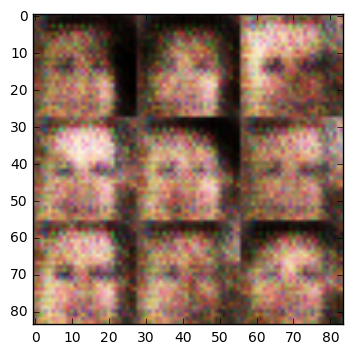

Step: 210: Epoch 1/1... Discriminator Loss: 0.7916... Generator Loss: 1.5957
Step: 220: Epoch 1/1... Discriminator Loss: 0.8215... Generator Loss: 1.3362
Step: 230: Epoch 1/1... Discriminator Loss: 0.9375... Generator Loss: 3.3719
Step: 240: Epoch 1/1... Discriminator Loss: 1.8943... Generator Loss: 0.4130
Step: 250: Epoch 1/1... Discriminator Loss: 0.7773... Generator Loss: 1.5579
Step: 260: Epoch 1/1... Discriminator Loss: 1.0095... Generator Loss: 1.9424
Step: 270: Epoch 1/1... Discriminator Loss: 1.1043... Generator Loss: 0.8247
Step: 280: Epoch 1/1... Discriminator Loss: 0.9698... Generator Loss: 1.3663
Step: 290: Epoch 1/1... Discriminator Loss: 0.8684... Generator Loss: 2.0996
Step: 300: Epoch 1/1... Discriminator Loss: 1.0370... Generator Loss: 0.8286


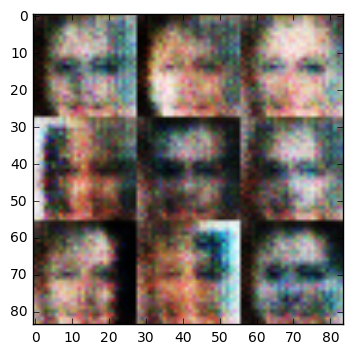

Step: 310: Epoch 1/1... Discriminator Loss: 0.9364... Generator Loss: 1.1390
Step: 320: Epoch 1/1... Discriminator Loss: 1.2658... Generator Loss: 0.6060
Step: 330: Epoch 1/1... Discriminator Loss: 0.9299... Generator Loss: 2.7083
Step: 340: Epoch 1/1... Discriminator Loss: 1.6175... Generator Loss: 0.4362
Step: 350: Epoch 1/1... Discriminator Loss: 1.2934... Generator Loss: 0.5902
Step: 360: Epoch 1/1... Discriminator Loss: 1.5131... Generator Loss: 3.9484
Step: 370: Epoch 1/1... Discriminator Loss: 0.7675... Generator Loss: 1.6449
Step: 380: Epoch 1/1... Discriminator Loss: 0.9630... Generator Loss: 0.9866
Step: 390: Epoch 1/1... Discriminator Loss: 1.3333... Generator Loss: 0.5299
Step: 400: Epoch 1/1... Discriminator Loss: 0.7049... Generator Loss: 2.6915


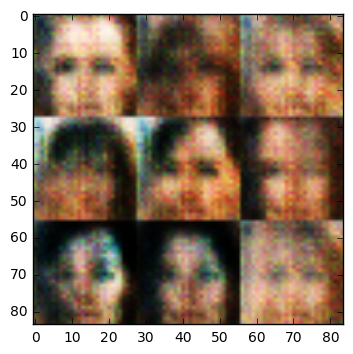

Step: 410: Epoch 1/1... Discriminator Loss: 1.1043... Generator Loss: 1.0885
Step: 420: Epoch 1/1... Discriminator Loss: 1.0765... Generator Loss: 2.1831
Step: 430: Epoch 1/1... Discriminator Loss: 1.3435... Generator Loss: 0.9951
Step: 440: Epoch 1/1... Discriminator Loss: 0.8744... Generator Loss: 1.2690
Step: 450: Epoch 1/1... Discriminator Loss: 0.7564... Generator Loss: 1.4060
Step: 460: Epoch 1/1... Discriminator Loss: 0.9363... Generator Loss: 0.9300
Step: 470: Epoch 1/1... Discriminator Loss: 0.6404... Generator Loss: 2.1848
Step: 480: Epoch 1/1... Discriminator Loss: 1.1019... Generator Loss: 1.3624
Step: 490: Epoch 1/1... Discriminator Loss: 0.9257... Generator Loss: 1.5296
Step: 500: Epoch 1/1... Discriminator Loss: 0.8627... Generator Loss: 1.9287


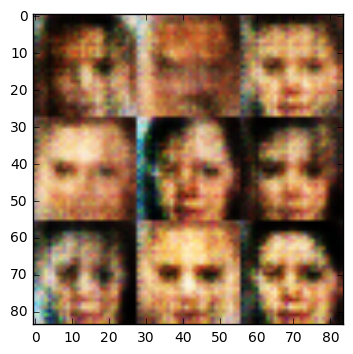

Step: 510: Epoch 1/1... Discriminator Loss: 1.0152... Generator Loss: 2.3591
Step: 520: Epoch 1/1... Discriminator Loss: 0.7778... Generator Loss: 1.4333
Step: 530: Epoch 1/1... Discriminator Loss: 0.7264... Generator Loss: 1.7594
Step: 540: Epoch 1/1... Discriminator Loss: 0.7310... Generator Loss: 1.6869
Step: 550: Epoch 1/1... Discriminator Loss: 1.4780... Generator Loss: 0.5051
Step: 560: Epoch 1/1... Discriminator Loss: 0.8809... Generator Loss: 1.1581
Step: 570: Epoch 1/1... Discriminator Loss: 0.9957... Generator Loss: 0.9266
Step: 580: Epoch 1/1... Discriminator Loss: 0.8387... Generator Loss: 2.5582
Step: 590: Epoch 1/1... Discriminator Loss: 2.2738... Generator Loss: 0.2669
Step: 600: Epoch 1/1... Discriminator Loss: 1.1525... Generator Loss: 3.4228


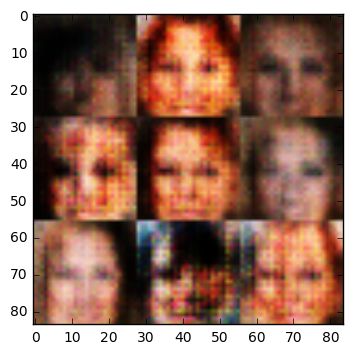

Step: 610: Epoch 1/1... Discriminator Loss: 1.1213... Generator Loss: 0.7121
Step: 620: Epoch 1/1... Discriminator Loss: 1.3160... Generator Loss: 0.6197
Step: 630: Epoch 1/1... Discriminator Loss: 1.2562... Generator Loss: 0.6559
Step: 640: Epoch 1/1... Discriminator Loss: 0.9473... Generator Loss: 1.0370
Step: 650: Epoch 1/1... Discriminator Loss: 0.8927... Generator Loss: 1.0667
Step: 660: Epoch 1/1... Discriminator Loss: 1.4185... Generator Loss: 0.5303
Step: 670: Epoch 1/1... Discriminator Loss: 0.6883... Generator Loss: 2.9590
Step: 680: Epoch 1/1... Discriminator Loss: 1.6916... Generator Loss: 0.4031
Step: 690: Epoch 1/1... Discriminator Loss: 0.8067... Generator Loss: 2.8284
Step: 700: Epoch 1/1... Discriminator Loss: 1.2078... Generator Loss: 0.7534


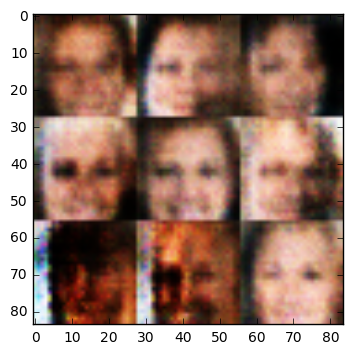

Step: 710: Epoch 1/1... Discriminator Loss: 1.1886... Generator Loss: 0.7972
Step: 720: Epoch 1/1... Discriminator Loss: 0.8988... Generator Loss: 1.0249
Step: 730: Epoch 1/1... Discriminator Loss: 0.8687... Generator Loss: 1.1734
Step: 740: Epoch 1/1... Discriminator Loss: 0.7904... Generator Loss: 2.5842
Step: 750: Epoch 1/1... Discriminator Loss: 0.9781... Generator Loss: 0.8676
Step: 760: Epoch 1/1... Discriminator Loss: 1.5617... Generator Loss: 0.3965
Step: 770: Epoch 1/1... Discriminator Loss: 1.3476... Generator Loss: 0.5628
Step: 780: Epoch 1/1... Discriminator Loss: 0.7552... Generator Loss: 1.6881
Step: 790: Epoch 1/1... Discriminator Loss: 0.9429... Generator Loss: 2.2777
Step: 800: Epoch 1/1... Discriminator Loss: 0.7520... Generator Loss: 2.8067


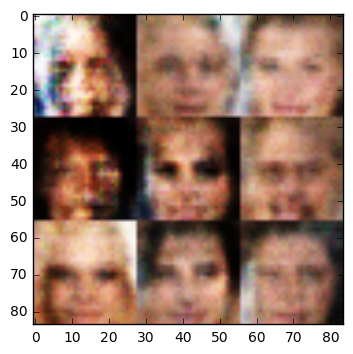

Step: 810: Epoch 1/1... Discriminator Loss: 0.6644... Generator Loss: 2.3027
Step: 820: Epoch 1/1... Discriminator Loss: 0.8006... Generator Loss: 1.3871
Step: 830: Epoch 1/1... Discriminator Loss: 1.2467... Generator Loss: 0.6469
Step: 840: Epoch 1/1... Discriminator Loss: 0.8017... Generator Loss: 1.6803
Step: 850: Epoch 1/1... Discriminator Loss: 1.0283... Generator Loss: 0.8130
Step: 860: Epoch 1/1... Discriminator Loss: 1.2858... Generator Loss: 0.5724
Step: 870: Epoch 1/1... Discriminator Loss: 1.3912... Generator Loss: 0.5160
Step: 880: Epoch 1/1... Discriminator Loss: 0.7479... Generator Loss: 1.8116
Step: 890: Epoch 1/1... Discriminator Loss: 0.8614... Generator Loss: 1.5145
Step: 900: Epoch 1/1... Discriminator Loss: 1.1169... Generator Loss: 0.7254


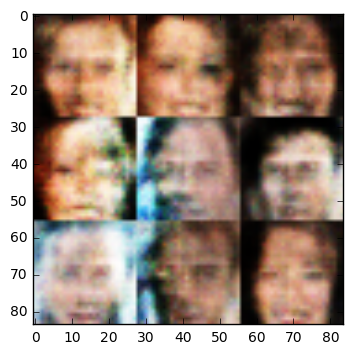

Step: 910: Epoch 1/1... Discriminator Loss: 1.2492... Generator Loss: 0.6123
Step: 920: Epoch 1/1... Discriminator Loss: 2.2225... Generator Loss: 0.2064
Step: 930: Epoch 1/1... Discriminator Loss: 0.9815... Generator Loss: 1.1778
Step: 940: Epoch 1/1... Discriminator Loss: 1.3154... Generator Loss: 0.5530
Step: 950: Epoch 1/1... Discriminator Loss: 1.3264... Generator Loss: 0.5943
Step: 960: Epoch 1/1... Discriminator Loss: 1.1119... Generator Loss: 0.7669
Step: 970: Epoch 1/1... Discriminator Loss: 1.2760... Generator Loss: 2.4853
Step: 980: Epoch 1/1... Discriminator Loss: 1.0580... Generator Loss: 0.8528
Step: 990: Epoch 1/1... Discriminator Loss: 1.1006... Generator Loss: 1.5544
Step: 1000: Epoch 1/1... Discriminator Loss: 0.9548... Generator Loss: 0.9345


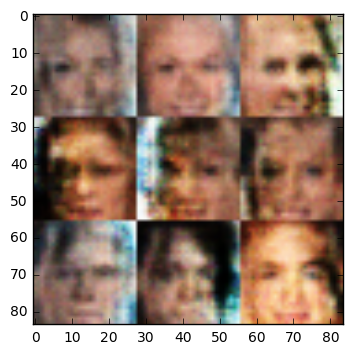

Step: 1010: Epoch 1/1... Discriminator Loss: 0.6899... Generator Loss: 1.5736
Step: 1020: Epoch 1/1... Discriminator Loss: 1.0129... Generator Loss: 1.6955
Step: 1030: Epoch 1/1... Discriminator Loss: 1.2034... Generator Loss: 0.6496
Step: 1040: Epoch 1/1... Discriminator Loss: 0.6546... Generator Loss: 1.8610
Step: 1050: Epoch 1/1... Discriminator Loss: 1.0885... Generator Loss: 0.7483
Step: 1060: Epoch 1/1... Discriminator Loss: 1.3947... Generator Loss: 0.4976
Step: 1070: Epoch 1/1... Discriminator Loss: 1.0511... Generator Loss: 0.7835
Step: 1080: Epoch 1/1... Discriminator Loss: 0.9953... Generator Loss: 0.8553
Step: 1090: Epoch 1/1... Discriminator Loss: 1.5450... Generator Loss: 0.4361
Step: 1100: Epoch 1/1... Discriminator Loss: 1.4062... Generator Loss: 0.4995


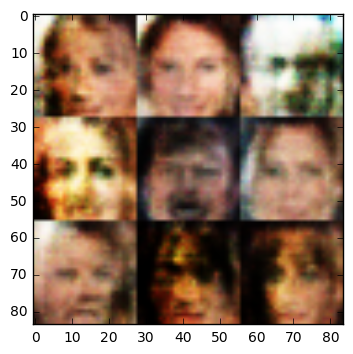

Step: 1110: Epoch 1/1... Discriminator Loss: 1.6235... Generator Loss: 0.4151
Step: 1120: Epoch 1/1... Discriminator Loss: 0.8294... Generator Loss: 1.4030
Step: 1130: Epoch 1/1... Discriminator Loss: 1.5475... Generator Loss: 0.4293
Step: 1140: Epoch 1/1... Discriminator Loss: 1.3234... Generator Loss: 0.5645
Step: 1150: Epoch 1/1... Discriminator Loss: 0.9833... Generator Loss: 2.3095
Step: 1160: Epoch 1/1... Discriminator Loss: 0.8374... Generator Loss: 1.0980
Step: 1170: Epoch 1/1... Discriminator Loss: 0.7037... Generator Loss: 1.6314
Step: 1180: Epoch 1/1... Discriminator Loss: 1.0155... Generator Loss: 2.0607
Step: 1190: Epoch 1/1... Discriminator Loss: 1.7444... Generator Loss: 0.4234
Step: 1200: Epoch 1/1... Discriminator Loss: 1.4861... Generator Loss: 0.4617


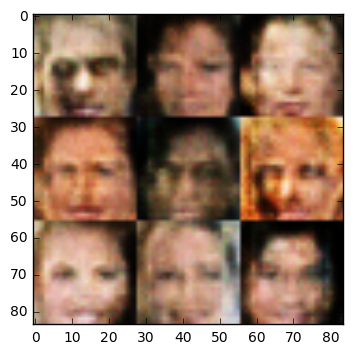

Step: 1210: Epoch 1/1... Discriminator Loss: 0.8214... Generator Loss: 1.3851
Step: 1220: Epoch 1/1... Discriminator Loss: 0.9929... Generator Loss: 2.0117
Step: 1230: Epoch 1/1... Discriminator Loss: 0.9269... Generator Loss: 1.4876
Step: 1240: Epoch 1/1... Discriminator Loss: 0.8617... Generator Loss: 2.4969
Step: 1250: Epoch 1/1... Discriminator Loss: 0.8130... Generator Loss: 1.1533
Step: 1260: Epoch 1/1... Discriminator Loss: 2.0694... Generator Loss: 0.2236
Step: 1270: Epoch 1/1... Discriminator Loss: 1.0102... Generator Loss: 0.8502
Step: 1280: Epoch 1/1... Discriminator Loss: 0.9801... Generator Loss: 0.8489
Step: 1290: Epoch 1/1... Discriminator Loss: 1.0391... Generator Loss: 0.8669
Step: 1300: Epoch 1/1... Discriminator Loss: 0.7724... Generator Loss: 1.3600


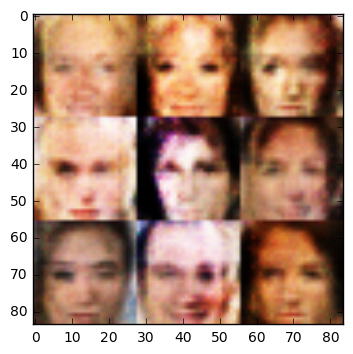

Step: 1310: Epoch 1/1... Discriminator Loss: 1.7643... Generator Loss: 0.3520
Step: 1320: Epoch 1/1... Discriminator Loss: 1.4169... Generator Loss: 0.4756
Step: 1330: Epoch 1/1... Discriminator Loss: 0.8342... Generator Loss: 1.8876
Step: 1340: Epoch 1/1... Discriminator Loss: 0.9702... Generator Loss: 0.9976
Step: 1350: Epoch 1/1... Discriminator Loss: 1.2416... Generator Loss: 0.5979
Step: 1360: Epoch 1/1... Discriminator Loss: 1.2130... Generator Loss: 0.6499
Step: 1370: Epoch 1/1... Discriminator Loss: 1.0353... Generator Loss: 0.8721
Step: 1380: Epoch 1/1... Discriminator Loss: 0.6807... Generator Loss: 1.6308
Step: 1390: Epoch 1/1... Discriminator Loss: 1.0721... Generator Loss: 0.7112
Step: 1400: Epoch 1/1... Discriminator Loss: 0.6869... Generator Loss: 1.9585


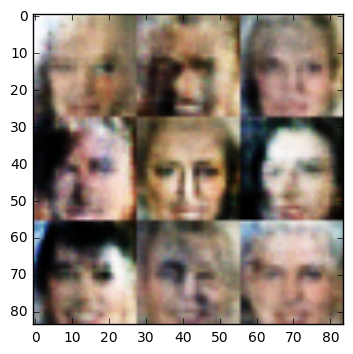

Step: 1410: Epoch 1/1... Discriminator Loss: 1.0466... Generator Loss: 0.9900
Step: 1420: Epoch 1/1... Discriminator Loss: 0.9256... Generator Loss: 1.4084
Step: 1430: Epoch 1/1... Discriminator Loss: 0.8519... Generator Loss: 1.0516
Step: 1440: Epoch 1/1... Discriminator Loss: 1.9648... Generator Loss: 0.2849
Step: 1450: Epoch 1/1... Discriminator Loss: 0.8467... Generator Loss: 1.2039
Step: 1460: Epoch 1/1... Discriminator Loss: 0.6073... Generator Loss: 1.8084
Step: 1470: Epoch 1/1... Discriminator Loss: 0.8313... Generator Loss: 2.2142
Step: 1480: Epoch 1/1... Discriminator Loss: 0.5058... Generator Loss: 2.8212
Step: 1490: Epoch 1/1... Discriminator Loss: 0.5928... Generator Loss: 1.6314
Step: 1500: Epoch 1/1... Discriminator Loss: 0.6164... Generator Loss: 3.4182


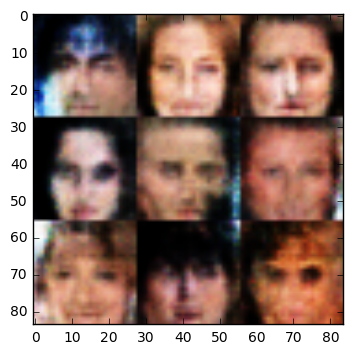

Step: 1510: Epoch 1/1... Discriminator Loss: 1.2673... Generator Loss: 0.5913
Step: 1520: Epoch 1/1... Discriminator Loss: 1.3747... Generator Loss: 0.5445
Step: 1530: Epoch 1/1... Discriminator Loss: 0.6850... Generator Loss: 1.5377
Step: 1540: Epoch 1/1... Discriminator Loss: 0.8597... Generator Loss: 0.9722
Step: 1550: Epoch 1/1... Discriminator Loss: 2.0049... Generator Loss: 0.2963
Step: 1560: Epoch 1/1... Discriminator Loss: 0.7664... Generator Loss: 1.2100
Step: 1570: Epoch 1/1... Discriminator Loss: 0.7920... Generator Loss: 1.0811
Step: 1580: Epoch 1/1... Discriminator Loss: 0.8202... Generator Loss: 1.0522
Step: 1590: Epoch 1/1... Discriminator Loss: 1.3725... Generator Loss: 0.5665
Step: 1600: Epoch 1/1... Discriminator Loss: 0.7768... Generator Loss: 1.2417


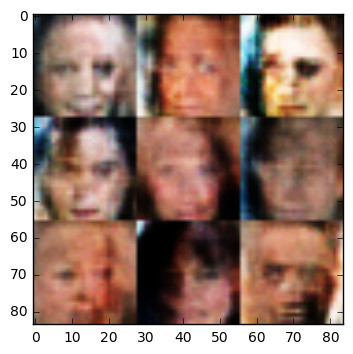

Step: 1610: Epoch 1/1... Discriminator Loss: 1.6988... Generator Loss: 0.3767
Step: 1620: Epoch 1/1... Discriminator Loss: 0.6684... Generator Loss: 1.4891
Step: 1630: Epoch 1/1... Discriminator Loss: 0.4494... Generator Loss: 4.1992
Step: 1640: Epoch 1/1... Discriminator Loss: 0.8197... Generator Loss: 3.8903
Step: 1650: Epoch 1/1... Discriminator Loss: 0.7455... Generator Loss: 2.3201
Step: 1660: Epoch 1/1... Discriminator Loss: 0.6611... Generator Loss: 2.4901
Step: 1670: Epoch 1/1... Discriminator Loss: 0.6781... Generator Loss: 1.6639
Step: 1680: Epoch 1/1... Discriminator Loss: 0.6516... Generator Loss: 3.4852
Step: 1690: Epoch 1/1... Discriminator Loss: 0.4398... Generator Loss: 2.7327
Step: 1700: Epoch 1/1... Discriminator Loss: 0.6851... Generator Loss: 1.3339


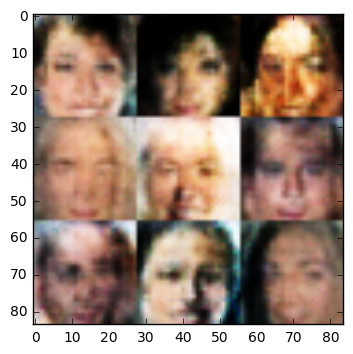

Step: 1710: Epoch 1/1... Discriminator Loss: 0.5078... Generator Loss: 2.0924
Step: 1720: Epoch 1/1... Discriminator Loss: 0.6298... Generator Loss: 1.6270
Step: 1730: Epoch 1/1... Discriminator Loss: 0.4974... Generator Loss: 3.5997
Step: 1740: Epoch 1/1... Discriminator Loss: 0.9734... Generator Loss: 0.9370
Step: 1750: Epoch 1/1... Discriminator Loss: 0.5311... Generator Loss: 2.7662
Step: 1760: Epoch 1/1... Discriminator Loss: 0.4138... Generator Loss: 3.5448
Step: 1770: Epoch 1/1... Discriminator Loss: 0.5548... Generator Loss: 4.5301
Step: 1780: Epoch 1/1... Discriminator Loss: 0.5203... Generator Loss: 2.6096
Step: 1790: Epoch 1/1... Discriminator Loss: 0.4614... Generator Loss: 2.2492
Step: 1800: Epoch 1/1... Discriminator Loss: 0.4628... Generator Loss: 2.5099


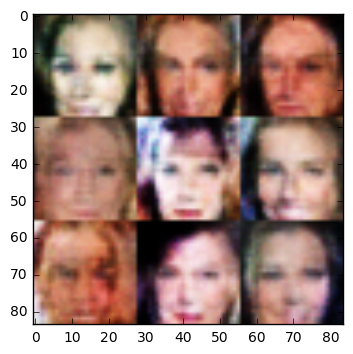

Step: 1810: Epoch 1/1... Discriminator Loss: 0.4699... Generator Loss: 4.2019
Step: 1820: Epoch 1/1... Discriminator Loss: 0.4637... Generator Loss: 2.4015
Step: 1830: Epoch 1/1... Discriminator Loss: 0.8397... Generator Loss: 1.0986
Step: 1840: Epoch 1/1... Discriminator Loss: 1.8555... Generator Loss: 4.4512
Step: 1850: Epoch 1/1... Discriminator Loss: 0.6395... Generator Loss: 2.8480
Step: 1860: Epoch 1/1... Discriminator Loss: 0.6136... Generator Loss: 1.7240
Step: 1870: Epoch 1/1... Discriminator Loss: 0.8355... Generator Loss: 1.1103
Step: 1880: Epoch 1/1... Discriminator Loss: 0.4706... Generator Loss: 2.4111
Step: 1890: Epoch 1/1... Discriminator Loss: 0.5718... Generator Loss: 1.8041
Step: 1900: Epoch 1/1... Discriminator Loss: 0.5195... Generator Loss: 2.0674


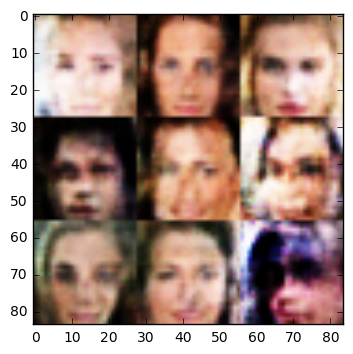

Step: 1910: Epoch 1/1... Discriminator Loss: 0.4817... Generator Loss: 2.3050
Step: 1920: Epoch 1/1... Discriminator Loss: 0.9528... Generator Loss: 5.7967
Step: 1930: Epoch 1/1... Discriminator Loss: 1.2871... Generator Loss: 0.5569
Step: 1940: Epoch 1/1... Discriminator Loss: 0.4124... Generator Loss: 2.8150
Step: 1950: Epoch 1/1... Discriminator Loss: 2.6950... Generator Loss: 3.4179
Step: 1960: Epoch 1/1... Discriminator Loss: 0.9197... Generator Loss: 0.9204
Step: 1970: Epoch 1/1... Discriminator Loss: 0.4641... Generator Loss: 2.5797
Step: 1980: Epoch 1/1... Discriminator Loss: 0.9339... Generator Loss: 4.1519
Step: 1990: Epoch 1/1... Discriminator Loss: 0.4194... Generator Loss: 2.7205
Step: 2000: Epoch 1/1... Discriminator Loss: 0.4105... Generator Loss: 3.2702


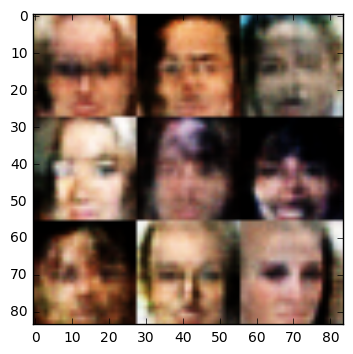

Step: 2010: Epoch 1/1... Discriminator Loss: 0.7269... Generator Loss: 1.3081
Step: 2020: Epoch 1/1... Discriminator Loss: 0.6659... Generator Loss: 1.4569
Step: 2030: Epoch 1/1... Discriminator Loss: 1.2131... Generator Loss: 0.6552
Step: 2040: Epoch 1/1... Discriminator Loss: 0.4776... Generator Loss: 3.3824
Step: 2050: Epoch 1/1... Discriminator Loss: 0.5322... Generator Loss: 1.8975
Step: 2060: Epoch 1/1... Discriminator Loss: 0.4256... Generator Loss: 3.1107
Step: 2070: Epoch 1/1... Discriminator Loss: 0.4073... Generator Loss: 3.0826
Step: 2080: Epoch 1/1... Discriminator Loss: 0.7460... Generator Loss: 4.9119
Step: 2090: Epoch 1/1... Discriminator Loss: 0.3653... Generator Loss: 4.4016
Step: 2100: Epoch 1/1... Discriminator Loss: 0.5244... Generator Loss: 5.1906


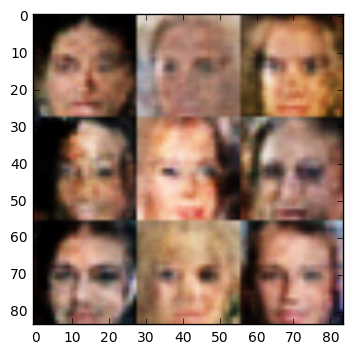

Step: 2110: Epoch 1/1... Discriminator Loss: 0.3834... Generator Loss: 4.3874
Step: 2120: Epoch 1/1... Discriminator Loss: 0.6353... Generator Loss: 3.6978
Step: 2130: Epoch 1/1... Discriminator Loss: 0.4192... Generator Loss: 3.8664
Step: 2140: Epoch 1/1... Discriminator Loss: 0.8304... Generator Loss: 6.1823
Step: 2150: Epoch 1/1... Discriminator Loss: 0.4734... Generator Loss: 2.6557
Step: 2160: Epoch 1/1... Discriminator Loss: 0.6035... Generator Loss: 1.6689
Step: 2170: Epoch 1/1... Discriminator Loss: 0.4305... Generator Loss: 2.7684
Step: 2180: Epoch 1/1... Discriminator Loss: 0.5371... Generator Loss: 6.1187
Step: 2190: Epoch 1/1... Discriminator Loss: 0.7702... Generator Loss: 1.1925
Step: 2200: Epoch 1/1... Discriminator Loss: 0.6829... Generator Loss: 1.3256


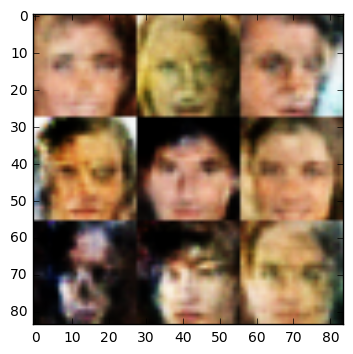

Step: 2210: Epoch 1/1... Discriminator Loss: 0.4248... Generator Loss: 3.7531
Step: 2220: Epoch 1/1... Discriminator Loss: 0.6332... Generator Loss: 1.5382
Step: 2230: Epoch 1/1... Discriminator Loss: 0.5020... Generator Loss: 2.0241
Step: 2240: Epoch 1/1... Discriminator Loss: 0.8920... Generator Loss: 1.1159
Step: 2250: Epoch 1/1... Discriminator Loss: 2.5183... Generator Loss: 0.1538
Step: 2260: Epoch 1/1... Discriminator Loss: 0.5827... Generator Loss: 1.8590
Step: 2270: Epoch 1/1... Discriminator Loss: 0.4897... Generator Loss: 2.4701
Step: 2280: Epoch 1/1... Discriminator Loss: 0.5791... Generator Loss: 1.6356
Step: 2290: Epoch 1/1... Discriminator Loss: 0.5174... Generator Loss: 2.3524
Step: 2300: Epoch 1/1... Discriminator Loss: 0.8456... Generator Loss: 1.0460


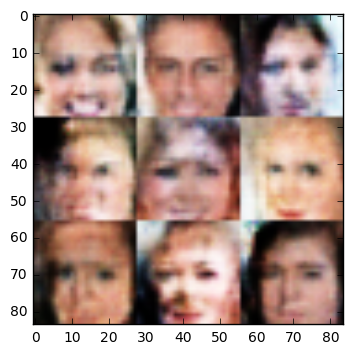

Step: 2310: Epoch 1/1... Discriminator Loss: 1.2634... Generator Loss: 6.1263
Step: 2320: Epoch 1/1... Discriminator Loss: 0.5839... Generator Loss: 1.6755
Step: 2330: Epoch 1/1... Discriminator Loss: 0.4278... Generator Loss: 2.6179
Step: 2340: Epoch 1/1... Discriminator Loss: 0.5059... Generator Loss: 3.3629
Step: 2350: Epoch 1/1... Discriminator Loss: 0.4164... Generator Loss: 2.8276
Step: 2360: Epoch 1/1... Discriminator Loss: 0.3972... Generator Loss: 3.8557
Step: 2370: Epoch 1/1... Discriminator Loss: 0.4073... Generator Loss: 3.0006
Step: 2380: Epoch 1/1... Discriminator Loss: 0.3775... Generator Loss: 3.8277
Step: 2390: Epoch 1/1... Discriminator Loss: 0.5069... Generator Loss: 2.0626
Step: 2400: Epoch 1/1... Discriminator Loss: 0.5503... Generator Loss: 1.8313


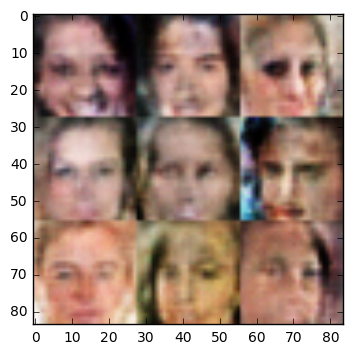

Step: 2410: Epoch 1/1... Discriminator Loss: 0.4524... Generator Loss: 3.8555
Step: 2420: Epoch 1/1... Discriminator Loss: 0.4424... Generator Loss: 2.7249
Step: 2430: Epoch 1/1... Discriminator Loss: 0.4542... Generator Loss: 2.3663
Step: 2440: Epoch 1/1... Discriminator Loss: 1.3631... Generator Loss: 0.6564
Step: 2450: Epoch 1/1... Discriminator Loss: 1.0915... Generator Loss: 1.3094
Step: 2460: Epoch 1/1... Discriminator Loss: 0.8344... Generator Loss: 1.1529
Step: 2470: Epoch 1/1... Discriminator Loss: 0.7153... Generator Loss: 1.4662
Step: 2480: Epoch 1/1... Discriminator Loss: 0.6412... Generator Loss: 1.6022
Step: 2490: Epoch 1/1... Discriminator Loss: 0.4626... Generator Loss: 2.3995
Step: 2500: Epoch 1/1... Discriminator Loss: 0.5637... Generator Loss: 2.8891


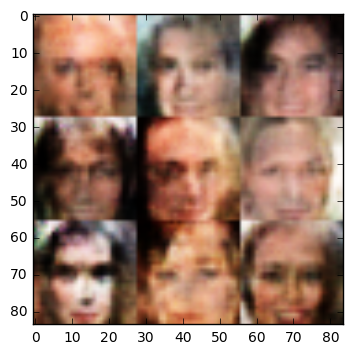

Step: 2510: Epoch 1/1... Discriminator Loss: 0.4120... Generator Loss: 2.8772
Step: 2520: Epoch 1/1... Discriminator Loss: 0.6117... Generator Loss: 2.9479
Step: 2530: Epoch 1/1... Discriminator Loss: 0.5974... Generator Loss: 1.6337
Step: 2540: Epoch 1/1... Discriminator Loss: 0.4824... Generator Loss: 2.2837
Step: 2550: Epoch 1/1... Discriminator Loss: 1.6566... Generator Loss: 3.5476
Step: 2560: Epoch 1/1... Discriminator Loss: 0.5137... Generator Loss: 2.0984
Step: 2570: Epoch 1/1... Discriminator Loss: 0.5083... Generator Loss: 3.2091
Step: 2580: Epoch 1/1... Discriminator Loss: 0.4125... Generator Loss: 3.3705
Step: 2590: Epoch 1/1... Discriminator Loss: 0.5554... Generator Loss: 2.0688
Step: 2600: Epoch 1/1... Discriminator Loss: 0.4560... Generator Loss: 2.6369


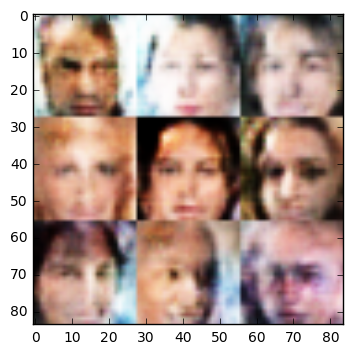

Step: 2610: Epoch 1/1... Discriminator Loss: 0.5718... Generator Loss: 2.2362
Step: 2620: Epoch 1/1... Discriminator Loss: 0.4608... Generator Loss: 2.5275
Step: 2630: Epoch 1/1... Discriminator Loss: 0.5209... Generator Loss: 3.8655
Step: 2640: Epoch 1/1... Discriminator Loss: 0.3778... Generator Loss: 3.8170
Step: 2650: Epoch 1/1... Discriminator Loss: 0.5529... Generator Loss: 1.7539
Step: 2660: Epoch 1/1... Discriminator Loss: 0.3996... Generator Loss: 4.4070
Step: 2670: Epoch 1/1... Discriminator Loss: 0.5996... Generator Loss: 2.8833
Step: 2680: Epoch 1/1... Discriminator Loss: 0.3499... Generator Loss: 4.7922
Step: 2690: Epoch 1/1... Discriminator Loss: 0.3824... Generator Loss: 3.9030
Step: 2700: Epoch 1/1... Discriminator Loss: 0.4524... Generator Loss: 3.6427


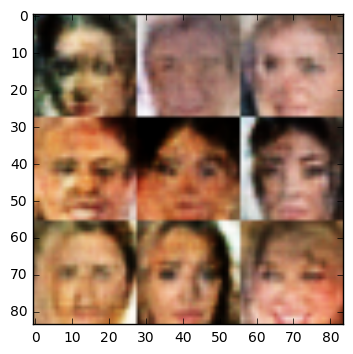

Step: 2710: Epoch 1/1... Discriminator Loss: 0.8327... Generator Loss: 3.8365
Step: 2720: Epoch 1/1... Discriminator Loss: 0.7240... Generator Loss: 1.4855
Step: 2730: Epoch 1/1... Discriminator Loss: 0.7273... Generator Loss: 1.3384
Step: 2740: Epoch 1/1... Discriminator Loss: 0.7148... Generator Loss: 1.4101
Step: 2750: Epoch 1/1... Discriminator Loss: 0.6798... Generator Loss: 1.4041
Step: 2760: Epoch 1/1... Discriminator Loss: 0.4974... Generator Loss: 2.3319
Step: 2770: Epoch 1/1... Discriminator Loss: 0.5389... Generator Loss: 2.3547
Step: 2780: Epoch 1/1... Discriminator Loss: 0.4923... Generator Loss: 2.1980
Step: 2790: Epoch 1/1... Discriminator Loss: 0.7363... Generator Loss: 2.7673
Step: 2800: Epoch 1/1... Discriminator Loss: 0.4109... Generator Loss: 3.1578


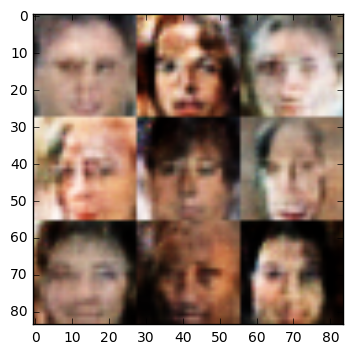

Step: 2810: Epoch 1/1... Discriminator Loss: 0.4101... Generator Loss: 3.9765
Step: 2820: Epoch 1/1... Discriminator Loss: 0.4066... Generator Loss: 3.3756
Step: 2830: Epoch 1/1... Discriminator Loss: 0.4684... Generator Loss: 3.7429
Step: 2840: Epoch 1/1... Discriminator Loss: 0.4921... Generator Loss: 2.3662
Step: 2850: Epoch 1/1... Discriminator Loss: 0.7596... Generator Loss: 1.1880
Step: 2860: Epoch 1/1... Discriminator Loss: 0.5477... Generator Loss: 1.9349
Step: 2870: Epoch 1/1... Discriminator Loss: 0.5673... Generator Loss: 3.6878
Step: 2880: Epoch 1/1... Discriminator Loss: 0.5768... Generator Loss: 2.8482
Step: 2890: Epoch 1/1... Discriminator Loss: 1.2217... Generator Loss: 0.6456
Step: 2900: Epoch 1/1... Discriminator Loss: 1.7974... Generator Loss: 0.4153


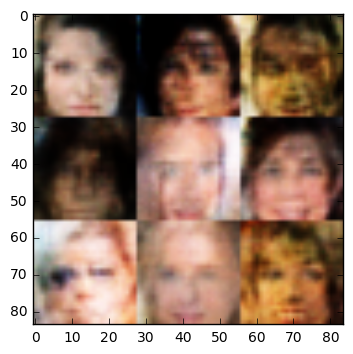

Step: 2910: Epoch 1/1... Discriminator Loss: 1.6208... Generator Loss: 3.8122
Step: 2920: Epoch 1/1... Discriminator Loss: 0.6888... Generator Loss: 1.3407
Step: 2930: Epoch 1/1... Discriminator Loss: 0.6001... Generator Loss: 3.9022
Step: 2940: Epoch 1/1... Discriminator Loss: 0.4460... Generator Loss: 2.9932
Step: 2950: Epoch 1/1... Discriminator Loss: 0.4338... Generator Loss: 2.9945
Step: 2960: Epoch 1/1... Discriminator Loss: 0.6212... Generator Loss: 3.4793
Step: 2970: Epoch 1/1... Discriminator Loss: 0.9906... Generator Loss: 2.1763
Step: 2980: Epoch 1/1... Discriminator Loss: 0.7302... Generator Loss: 1.4039
Step: 2990: Epoch 1/1... Discriminator Loss: 0.6304... Generator Loss: 1.6457
Step: 3000: Epoch 1/1... Discriminator Loss: 0.4548... Generator Loss: 4.1769


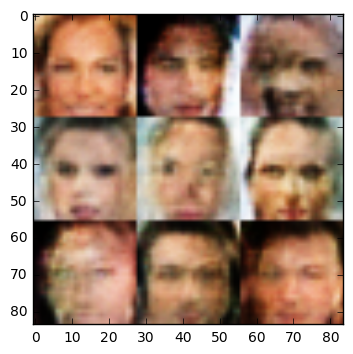

Step: 3010: Epoch 1/1... Discriminator Loss: 0.4307... Generator Loss: 2.7587
Step: 3020: Epoch 1/1... Discriminator Loss: 0.5127... Generator Loss: 2.3346
Step: 3030: Epoch 1/1... Discriminator Loss: 0.4175... Generator Loss: 4.0936
Step: 3040: Epoch 1/1... Discriminator Loss: 0.5567... Generator Loss: 1.7985
Step: 3050: Epoch 1/1... Discriminator Loss: 0.4596... Generator Loss: 2.6941
Step: 3060: Epoch 1/1... Discriminator Loss: 0.4911... Generator Loss: 3.3587
Step: 3070: Epoch 1/1... Discriminator Loss: 0.4486... Generator Loss: 2.4956
Step: 3080: Epoch 1/1... Discriminator Loss: 0.4687... Generator Loss: 2.3521
Step: 3090: Epoch 1/1... Discriminator Loss: 0.5671... Generator Loss: 2.1039
Step: 3100: Epoch 1/1... Discriminator Loss: 0.7500... Generator Loss: 1.3679


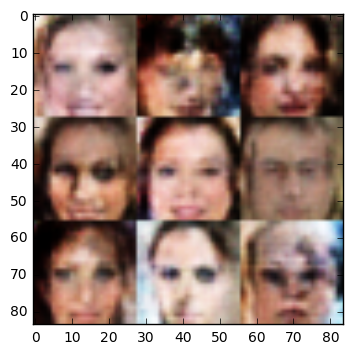

Step: 3110: Epoch 1/1... Discriminator Loss: 0.6166... Generator Loss: 3.6259
Step: 3120: Epoch 1/1... Discriminator Loss: 0.4133... Generator Loss: 2.9492
Step: 3130: Epoch 1/1... Discriminator Loss: 0.5621... Generator Loss: 2.1248
Step: 3140: Epoch 1/1... Discriminator Loss: 0.3758... Generator Loss: 3.3841
Step: 3150: Epoch 1/1... Discriminator Loss: 0.5156... Generator Loss: 2.2443
Step: 3160: Epoch 1/1... Discriminator Loss: 0.4204... Generator Loss: 2.8428
Step: 3170: Epoch 1/1... Discriminator Loss: 1.4891... Generator Loss: 0.6120
Step: 3180: Epoch 1/1... Discriminator Loss: 0.9675... Generator Loss: 0.9540
Step: 3190: Epoch 1/1... Discriminator Loss: 1.1288... Generator Loss: 0.7048
Step: 3200: Epoch 1/1... Discriminator Loss: 0.6962... Generator Loss: 1.4395


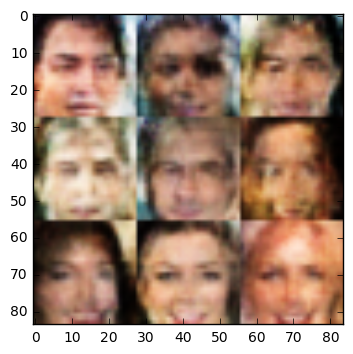

Step: 3210: Epoch 1/1... Discriminator Loss: 0.7166... Generator Loss: 2.4672
Step: 3220: Epoch 1/1... Discriminator Loss: 0.5245... Generator Loss: 2.1437
Step: 3230: Epoch 1/1... Discriminator Loss: 0.6281... Generator Loss: 1.7247
Step: 3240: Epoch 1/1... Discriminator Loss: 0.4932... Generator Loss: 2.1401
Step: 3250: Epoch 1/1... Discriminator Loss: 0.5097... Generator Loss: 2.1507
Step: 3260: Epoch 1/1... Discriminator Loss: 0.6205... Generator Loss: 1.5126
Step: 3270: Epoch 1/1... Discriminator Loss: 0.9416... Generator Loss: 0.9924
Step: 3280: Epoch 1/1... Discriminator Loss: 0.5457... Generator Loss: 2.5603
Step: 3290: Epoch 1/1... Discriminator Loss: 0.5358... Generator Loss: 1.9493
Step: 3300: Epoch 1/1... Discriminator Loss: 0.5507... Generator Loss: 5.9458


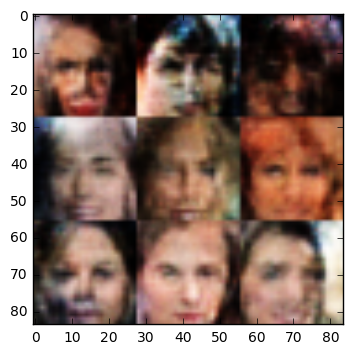

Step: 3310: Epoch 1/1... Discriminator Loss: 1.5928... Generator Loss: 2.9598
Step: 3320: Epoch 1/1... Discriminator Loss: 0.6426... Generator Loss: 1.6724
Step: 3330: Epoch 1/1... Discriminator Loss: 0.7980... Generator Loss: 1.1768
Step: 3340: Epoch 1/1... Discriminator Loss: 0.4183... Generator Loss: 2.9334
Step: 3350: Epoch 1/1... Discriminator Loss: 0.9299... Generator Loss: 0.9102
Step: 3360: Epoch 1/1... Discriminator Loss: 0.4418... Generator Loss: 3.1168
Step: 3370: Epoch 1/1... Discriminator Loss: 1.0773... Generator Loss: 0.8257
Step: 3380: Epoch 1/1... Discriminator Loss: 0.7269... Generator Loss: 4.7378
Step: 3390: Epoch 1/1... Discriminator Loss: 0.4660... Generator Loss: 2.4282
Step: 3400: Epoch 1/1... Discriminator Loss: 0.3822... Generator Loss: 3.4531


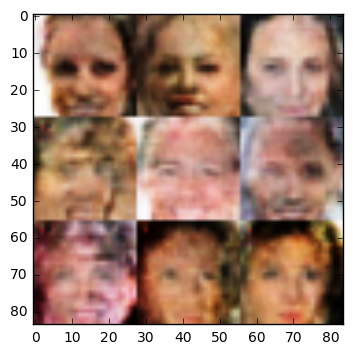

Step: 3410: Epoch 1/1... Discriminator Loss: 0.4175... Generator Loss: 2.8569
Step: 3420: Epoch 1/1... Discriminator Loss: 0.4762... Generator Loss: 2.8472
Step: 3430: Epoch 1/1... Discriminator Loss: 0.3689... Generator Loss: 4.0062
Step: 3440: Epoch 1/1... Discriminator Loss: 2.0659... Generator Loss: 0.2772
Step: 3450: Epoch 1/1... Discriminator Loss: 0.5044... Generator Loss: 2.3048
Step: 3460: Epoch 1/1... Discriminator Loss: 0.5870... Generator Loss: 1.6965
Step: 3470: Epoch 1/1... Discriminator Loss: 0.7377... Generator Loss: 2.2452
Step: 3480: Epoch 1/1... Discriminator Loss: 0.5073... Generator Loss: 2.1770
Step: 3490: Epoch 1/1... Discriminator Loss: 0.9407... Generator Loss: 0.9539
Step: 3500: Epoch 1/1... Discriminator Loss: 0.5097... Generator Loss: 2.0924


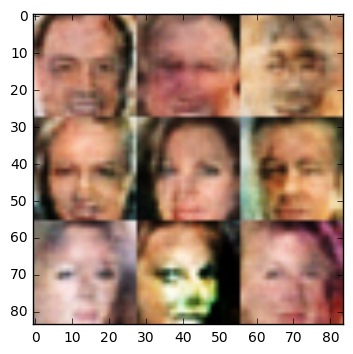

Step: 3510: Epoch 1/1... Discriminator Loss: 0.4022... Generator Loss: 4.3180
Step: 3520: Epoch 1/1... Discriminator Loss: 0.4104... Generator Loss: 2.9594
Step: 3530: Epoch 1/1... Discriminator Loss: 0.3611... Generator Loss: 4.0172
Step: 3540: Epoch 1/1... Discriminator Loss: 0.5306... Generator Loss: 2.0599
Step: 3550: Epoch 1/1... Discriminator Loss: 0.5328... Generator Loss: 1.9571
Step: 3560: Epoch 1/1... Discriminator Loss: 0.5184... Generator Loss: 2.0708
Step: 3570: Epoch 1/1... Discriminator Loss: 0.4252... Generator Loss: 2.9067
Step: 3580: Epoch 1/1... Discriminator Loss: 1.0986... Generator Loss: 1.0140
Step: 3590: Epoch 1/1... Discriminator Loss: 0.4252... Generator Loss: 3.6821
Step: 3600: Epoch 1/1... Discriminator Loss: 0.8124... Generator Loss: 4.5896


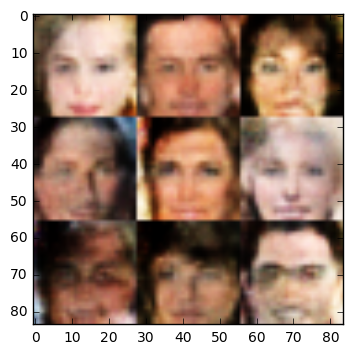

Step: 3610: Epoch 1/1... Discriminator Loss: 0.5298... Generator Loss: 2.0300
Step: 3620: Epoch 1/1... Discriminator Loss: 0.4634... Generator Loss: 2.3796
Step: 3630: Epoch 1/1... Discriminator Loss: 0.6563... Generator Loss: 1.4847
Step: 3640: Epoch 1/1... Discriminator Loss: 0.3876... Generator Loss: 3.5254
Step: 3650: Epoch 1/1... Discriminator Loss: 0.3784... Generator Loss: 3.7482
Step: 3660: Epoch 1/1... Discriminator Loss: 1.0135... Generator Loss: 4.7281
Step: 3670: Epoch 1/1... Discriminator Loss: 0.4760... Generator Loss: 2.5332
Step: 3680: Epoch 1/1... Discriminator Loss: 0.9271... Generator Loss: 3.8090
Step: 3690: Epoch 1/1... Discriminator Loss: 0.4755... Generator Loss: 2.3959
Step: 3700: Epoch 1/1... Discriminator Loss: 0.3853... Generator Loss: 3.4053


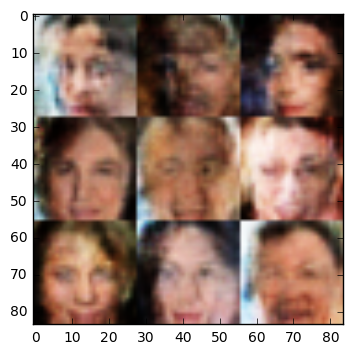

Step: 3710: Epoch 1/1... Discriminator Loss: 0.5319... Generator Loss: 2.1261
Step: 3720: Epoch 1/1... Discriminator Loss: 0.5918... Generator Loss: 3.0876
Step: 3730: Epoch 1/1... Discriminator Loss: 0.4826... Generator Loss: 2.8323
Step: 3740: Epoch 1/1... Discriminator Loss: 2.6807... Generator Loss: 0.2178
Step: 3750: Epoch 1/1... Discriminator Loss: 0.7773... Generator Loss: 1.2376
Step: 3760: Epoch 1/1... Discriminator Loss: 1.9570... Generator Loss: 3.6699
Step: 3770: Epoch 1/1... Discriminator Loss: 0.7141... Generator Loss: 1.4581
Step: 3780: Epoch 1/1... Discriminator Loss: 0.9905... Generator Loss: 0.8399
Step: 3790: Epoch 1/1... Discriminator Loss: 0.4225... Generator Loss: 4.5873
Step: 3800: Epoch 1/1... Discriminator Loss: 0.5451... Generator Loss: 2.7163


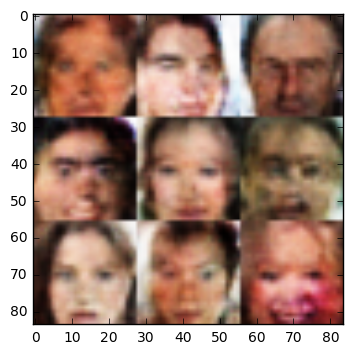

Step: 3810: Epoch 1/1... Discriminator Loss: 0.3979... Generator Loss: 3.9329
Step: 3820: Epoch 1/1... Discriminator Loss: 0.4219... Generator Loss: 2.8800
Step: 3830: Epoch 1/1... Discriminator Loss: 0.5163... Generator Loss: 2.0099
Step: 3840: Epoch 1/1... Discriminator Loss: 0.7247... Generator Loss: 1.3037
Step: 3850: Epoch 1/1... Discriminator Loss: 0.3988... Generator Loss: 4.0841
Step: 3860: Epoch 1/1... Discriminator Loss: 0.5117... Generator Loss: 2.4517
Step: 3870: Epoch 1/1... Discriminator Loss: 0.3553... Generator Loss: 4.3674
Step: 3880: Epoch 1/1... Discriminator Loss: 1.9949... Generator Loss: 0.3270
Step: 3890: Epoch 1/1... Discriminator Loss: 0.5220... Generator Loss: 2.2787
Step: 3900: Epoch 1/1... Discriminator Loss: 0.5137... Generator Loss: 2.0330


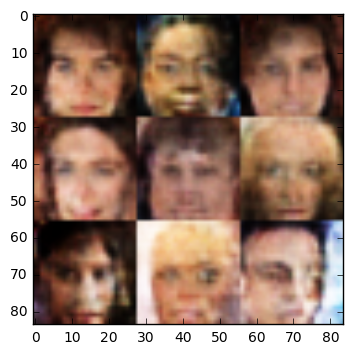

Step: 3910: Epoch 1/1... Discriminator Loss: 0.5691... Generator Loss: 1.9852
Step: 3920: Epoch 1/1... Discriminator Loss: 0.6143... Generator Loss: 1.6247
Step: 3930: Epoch 1/1... Discriminator Loss: 0.5021... Generator Loss: 2.1109
Step: 3940: Epoch 1/1... Discriminator Loss: 0.5732... Generator Loss: 2.8035
Step: 3950: Epoch 1/1... Discriminator Loss: 0.5809... Generator Loss: 1.6678
Step: 3960: Epoch 1/1... Discriminator Loss: 0.4568... Generator Loss: 2.9713
Step: 3970: Epoch 1/1... Discriminator Loss: 0.4442... Generator Loss: 2.8209
Step: 3980: Epoch 1/1... Discriminator Loss: 0.4569... Generator Loss: 2.4295
Step: 3990: Epoch 1/1... Discriminator Loss: 0.4201... Generator Loss: 3.0019
Step: 4000: Epoch 1/1... Discriminator Loss: 0.4457... Generator Loss: 2.7946


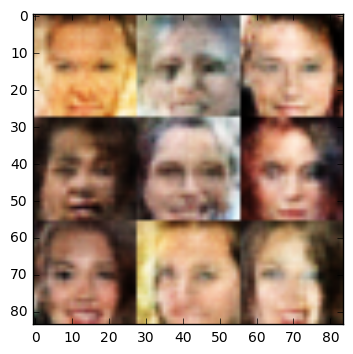

Step: 4010: Epoch 1/1... Discriminator Loss: 0.4858... Generator Loss: 2.8636
Step: 4020: Epoch 1/1... Discriminator Loss: 0.6792... Generator Loss: 1.6386
Step: 4030: Epoch 1/1... Discriminator Loss: 0.6803... Generator Loss: 3.6490
Step: 4040: Epoch 1/1... Discriminator Loss: 2.3797... Generator Loss: 0.2600
Step: 4050: Epoch 1/1... Discriminator Loss: 0.6963... Generator Loss: 1.9775
Step: 4060: Epoch 1/1... Discriminator Loss: 0.8537... Generator Loss: 1.1101
Step: 4070: Epoch 1/1... Discriminator Loss: 1.0037... Generator Loss: 0.9180
Step: 4080: Epoch 1/1... Discriminator Loss: 0.5493... Generator Loss: 1.9003
Step: 4090: Epoch 1/1... Discriminator Loss: 0.4523... Generator Loss: 2.5174
Step: 4100: Epoch 1/1... Discriminator Loss: 0.5119... Generator Loss: 2.0088


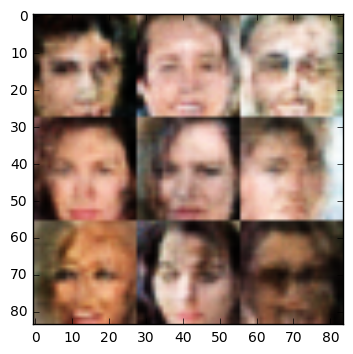

Step: 4110: Epoch 1/1... Discriminator Loss: 0.4450... Generator Loss: 4.7693
Step: 4120: Epoch 1/1... Discriminator Loss: 0.7153... Generator Loss: 1.4878
Step: 4130: Epoch 1/1... Discriminator Loss: 0.4259... Generator Loss: 3.1106
Step: 4140: Epoch 1/1... Discriminator Loss: 0.6315... Generator Loss: 1.6864
Step: 4150: Epoch 1/1... Discriminator Loss: 0.4032... Generator Loss: 3.0316
Step: 4160: Epoch 1/1... Discriminator Loss: 1.4294... Generator Loss: 0.7258
Step: 4170: Epoch 1/1... Discriminator Loss: 0.4566... Generator Loss: 2.8745
Step: 4180: Epoch 1/1... Discriminator Loss: 0.4797... Generator Loss: 2.3339
Step: 4190: Epoch 1/1... Discriminator Loss: 2.9251... Generator Loss: 3.1611
Step: 4200: Epoch 1/1... Discriminator Loss: 0.9635... Generator Loss: 0.9785


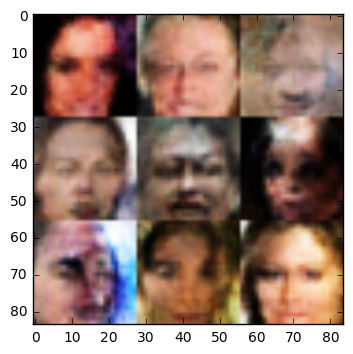

Step: 4210: Epoch 1/1... Discriminator Loss: 1.1794... Generator Loss: 4.3687
Step: 4220: Epoch 1/1... Discriminator Loss: 1.2079... Generator Loss: 0.7174
Step: 4230: Epoch 1/1... Discriminator Loss: 0.4818... Generator Loss: 2.8521
Step: 4240: Epoch 1/1... Discriminator Loss: 1.0564... Generator Loss: 3.7423
Step: 4250: Epoch 1/1... Discriminator Loss: 0.4495... Generator Loss: 3.0239
Step: 4260: Epoch 1/1... Discriminator Loss: 0.4224... Generator Loss: 2.8536
Step: 4270: Epoch 1/1... Discriminator Loss: 0.4736... Generator Loss: 2.6229
Step: 4280: Epoch 1/1... Discriminator Loss: 0.4993... Generator Loss: 2.2714
Step: 4290: Epoch 1/1... Discriminator Loss: 0.5514... Generator Loss: 1.8475
Step: 4300: Epoch 1/1... Discriminator Loss: 0.5931... Generator Loss: 1.7257


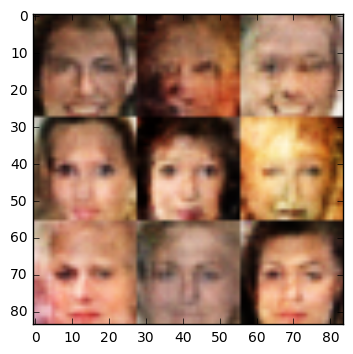

Step: 4310: Epoch 1/1... Discriminator Loss: 1.1236... Generator Loss: 0.8008
Step: 4320: Epoch 1/1... Discriminator Loss: 0.6851... Generator Loss: 1.4777
Step: 4330: Epoch 1/1... Discriminator Loss: 0.4331... Generator Loss: 2.7841
Step: 4340: Epoch 1/1... Discriminator Loss: 0.6904... Generator Loss: 1.3456
Step: 4350: Epoch 1/1... Discriminator Loss: 0.4084... Generator Loss: 3.5114
Step: 4360: Epoch 1/1... Discriminator Loss: 0.4680... Generator Loss: 2.4160
Step: 4370: Epoch 1/1... Discriminator Loss: 0.4161... Generator Loss: 2.9602
Step: 4380: Epoch 1/1... Discriminator Loss: 1.4154... Generator Loss: 5.3267
Step: 4390: Epoch 1/1... Discriminator Loss: 1.0095... Generator Loss: 0.9135
Step: 4400: Epoch 1/1... Discriminator Loss: 0.4081... Generator Loss: 3.3322


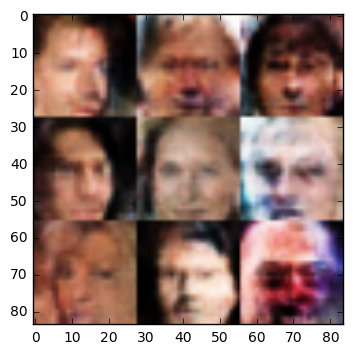

Step: 4410: Epoch 1/1... Discriminator Loss: 1.1939... Generator Loss: 0.7116
Step: 4420: Epoch 1/1... Discriminator Loss: 0.5965... Generator Loss: 1.6334
Step: 4430: Epoch 1/1... Discriminator Loss: 0.4782... Generator Loss: 2.4158
Step: 4440: Epoch 1/1... Discriminator Loss: 0.4682... Generator Loss: 2.4767
Step: 4450: Epoch 1/1... Discriminator Loss: 0.4015... Generator Loss: 3.2968
Step: 4460: Epoch 1/1... Discriminator Loss: 0.5153... Generator Loss: 2.1336
Step: 4470: Epoch 1/1... Discriminator Loss: 0.4992... Generator Loss: 2.5319
Step: 4480: Epoch 1/1... Discriminator Loss: 2.4502... Generator Loss: 4.4556
Step: 4490: Epoch 1/1... Discriminator Loss: 1.8456... Generator Loss: 0.4009
Step: 4500: Epoch 1/1... Discriminator Loss: 0.6225... Generator Loss: 1.6135


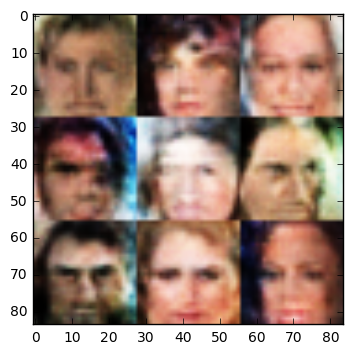

Step: 4510: Epoch 1/1... Discriminator Loss: 0.4911... Generator Loss: 2.9342
Step: 4520: Epoch 1/1... Discriminator Loss: 0.6511... Generator Loss: 1.6596
Step: 4530: Epoch 1/1... Discriminator Loss: 0.5323... Generator Loss: 1.9766
Step: 4540: Epoch 1/1... Discriminator Loss: 0.4139... Generator Loss: 3.1507
Step: 4550: Epoch 1/1... Discriminator Loss: 0.4481... Generator Loss: 2.6485
Step: 4560: Epoch 1/1... Discriminator Loss: 0.6191... Generator Loss: 1.5137
Step: 4570: Epoch 1/1... Discriminator Loss: 0.3930... Generator Loss: 4.1097
Step: 4580: Epoch 1/1... Discriminator Loss: 0.4395... Generator Loss: 3.0156
Step: 4590: Epoch 1/1... Discriminator Loss: 0.4026... Generator Loss: 3.2605
Step: 4600: Epoch 1/1... Discriminator Loss: 0.4557... Generator Loss: 2.8334


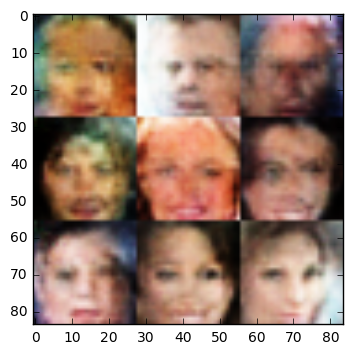

Step: 4610: Epoch 1/1... Discriminator Loss: 1.0124... Generator Loss: 1.0707
Step: 4620: Epoch 1/1... Discriminator Loss: 0.5248... Generator Loss: 2.3847
Step: 4630: Epoch 1/1... Discriminator Loss: 0.7569... Generator Loss: 1.2776
Step: 4640: Epoch 1/1... Discriminator Loss: 0.8095... Generator Loss: 1.1097
Step: 4650: Epoch 1/1... Discriminator Loss: 0.3821... Generator Loss: 3.4873
Step: 4660: Epoch 1/1... Discriminator Loss: 0.4339... Generator Loss: 2.7305
Step: 4670: Epoch 1/1... Discriminator Loss: 0.4918... Generator Loss: 2.3035
Step: 4680: Epoch 1/1... Discriminator Loss: 0.5654... Generator Loss: 3.0484
Step: 4690: Epoch 1/1... Discriminator Loss: 1.7004... Generator Loss: 0.4119
Step: 4700: Epoch 1/1... Discriminator Loss: 0.5280... Generator Loss: 1.9813


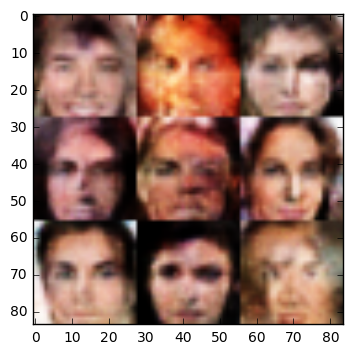

Step: 4710: Epoch 1/1... Discriminator Loss: 0.4949... Generator Loss: 2.1579
Step: 4720: Epoch 1/1... Discriminator Loss: 0.7277... Generator Loss: 1.2875
Step: 4730: Epoch 1/1... Discriminator Loss: 3.4811... Generator Loss: 0.0996
Step: 4740: Epoch 1/1... Discriminator Loss: 0.8207... Generator Loss: 1.3954
Step: 4750: Epoch 1/1... Discriminator Loss: 0.8703... Generator Loss: 2.7575
Step: 4760: Epoch 1/1... Discriminator Loss: 0.5609... Generator Loss: 1.8491
Step: 4770: Epoch 1/1... Discriminator Loss: 0.7408... Generator Loss: 1.2304
Step: 4780: Epoch 1/1... Discriminator Loss: 0.6130... Generator Loss: 2.5135
Step: 4790: Epoch 1/1... Discriminator Loss: 1.0202... Generator Loss: 0.8543
Step: 4800: Epoch 1/1... Discriminator Loss: 0.4754... Generator Loss: 2.2326


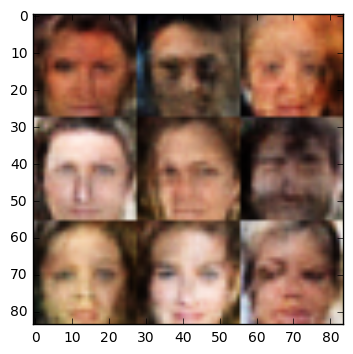

Step: 4810: Epoch 1/1... Discriminator Loss: 0.6653... Generator Loss: 1.5174
Step: 4820: Epoch 1/1... Discriminator Loss: 0.4759... Generator Loss: 2.6599
Step: 4830: Epoch 1/1... Discriminator Loss: 0.6828... Generator Loss: 1.5459
Step: 4840: Epoch 1/1... Discriminator Loss: 0.7330... Generator Loss: 1.4781
Step: 4850: Epoch 1/1... Discriminator Loss: 0.9699... Generator Loss: 0.8822
Step: 4860: Epoch 1/1... Discriminator Loss: 0.4761... Generator Loss: 2.3684
Step: 4870: Epoch 1/1... Discriminator Loss: 0.5418... Generator Loss: 2.3596
Step: 4880: Epoch 1/1... Discriminator Loss: 0.4926... Generator Loss: 2.4941
Step: 4890: Epoch 1/1... Discriminator Loss: 0.5351... Generator Loss: 1.8993
Step: 4900: Epoch 1/1... Discriminator Loss: 0.4971... Generator Loss: 2.3647


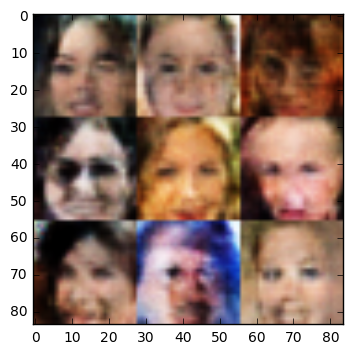

Step: 4910: Epoch 1/1... Discriminator Loss: 0.4176... Generator Loss: 3.7584
Step: 4920: Epoch 1/1... Discriminator Loss: 0.3708... Generator Loss: 4.3688
Step: 4930: Epoch 1/1... Discriminator Loss: 0.5093... Generator Loss: 2.0749
Step: 4940: Epoch 1/1... Discriminator Loss: 0.4723... Generator Loss: 2.8283
Step: 4950: Epoch 1/1... Discriminator Loss: 0.5566... Generator Loss: 1.9465
Step: 4960: Epoch 1/1... Discriminator Loss: 0.4232... Generator Loss: 2.7194
Step: 4970: Epoch 1/1... Discriminator Loss: 0.4211... Generator Loss: 3.0394
Step: 4980: Epoch 1/1... Discriminator Loss: 0.4579... Generator Loss: 2.3451
Step: 4990: Epoch 1/1... Discriminator Loss: 0.9224... Generator Loss: 4.9223
Step: 5000: Epoch 1/1... Discriminator Loss: 1.3051... Generator Loss: 0.7585


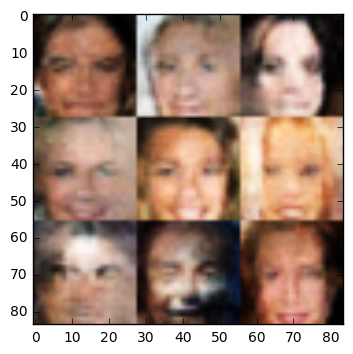

Step: 5010: Epoch 1/1... Discriminator Loss: 0.9031... Generator Loss: 1.5612
Step: 5020: Epoch 1/1... Discriminator Loss: 1.7780... Generator Loss: 0.3395
Step: 5030: Epoch 1/1... Discriminator Loss: 3.5542... Generator Loss: 0.0972
Step: 5040: Epoch 1/1... Discriminator Loss: 0.6852... Generator Loss: 2.6216
Step: 5050: Epoch 1/1... Discriminator Loss: 0.9829... Generator Loss: 0.9406
Step: 5060: Epoch 1/1... Discriminator Loss: 0.5787... Generator Loss: 1.8532
Step: 5070: Epoch 1/1... Discriminator Loss: 0.8090... Generator Loss: 1.2029
Step: 5080: Epoch 1/1... Discriminator Loss: 0.4999... Generator Loss: 2.4234
Step: 5090: Epoch 1/1... Discriminator Loss: 0.6389... Generator Loss: 1.9687
Step: 5100: Epoch 1/1... Discriminator Loss: 0.5400... Generator Loss: 2.4835


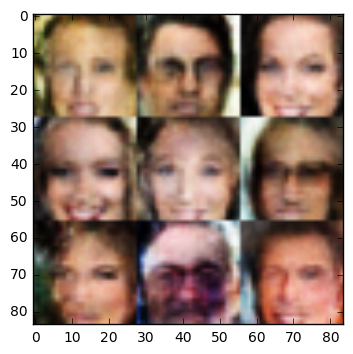

Step: 5110: Epoch 1/1... Discriminator Loss: 0.6782... Generator Loss: 1.9430
Step: 5120: Epoch 1/1... Discriminator Loss: 0.6377... Generator Loss: 2.7653
Step: 5130: Epoch 1/1... Discriminator Loss: 0.5625... Generator Loss: 1.9056
Step: 5140: Epoch 1/1... Discriminator Loss: 0.5545... Generator Loss: 2.1327
Step: 5150: Epoch 1/1... Discriminator Loss: 0.6007... Generator Loss: 1.6886
Step: 5160: Epoch 1/1... Discriminator Loss: 0.3841... Generator Loss: 4.0012
Step: 5170: Epoch 1/1... Discriminator Loss: 0.8103... Generator Loss: 1.1370
Step: 5180: Epoch 1/1... Discriminator Loss: 0.5311... Generator Loss: 1.9543
Step: 5190: Epoch 1/1... Discriminator Loss: 0.5039... Generator Loss: 2.2056
Step: 5200: Epoch 1/1... Discriminator Loss: 0.4637... Generator Loss: 2.8297


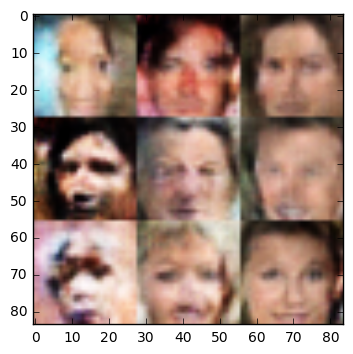

Step: 5210: Epoch 1/1... Discriminator Loss: 0.6648... Generator Loss: 1.8605
Step: 5220: Epoch 1/1... Discriminator Loss: 0.4498... Generator Loss: 2.8361
Step: 5230: Epoch 1/1... Discriminator Loss: 1.3288... Generator Loss: 0.6444
Step: 5240: Epoch 1/1... Discriminator Loss: 0.4112... Generator Loss: 3.4987
Step: 5250: Epoch 1/1... Discriminator Loss: 0.7747... Generator Loss: 1.2557
Step: 5260: Epoch 1/1... Discriminator Loss: 0.5184... Generator Loss: 2.1235
Step: 5270: Epoch 1/1... Discriminator Loss: 0.4090... Generator Loss: 3.2255
Step: 5280: Epoch 1/1... Discriminator Loss: 1.1354... Generator Loss: 0.7796
Step: 5290: Epoch 1/1... Discriminator Loss: 0.8666... Generator Loss: 1.0601
Step: 5300: Epoch 1/1... Discriminator Loss: 0.5135... Generator Loss: 3.8359


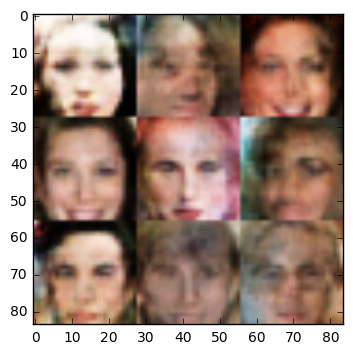

Step: 5310: Epoch 1/1... Discriminator Loss: 1.0781... Generator Loss: 0.7631
Step: 5320: Epoch 1/1... Discriminator Loss: 0.5018... Generator Loss: 2.1706
Step: 5330: Epoch 1/1... Discriminator Loss: 0.6056... Generator Loss: 1.8497
Step: 5340: Epoch 1/1... Discriminator Loss: 0.4128... Generator Loss: 3.0031
Step: 5350: Epoch 1/1... Discriminator Loss: 0.4429... Generator Loss: 4.1995
Step: 5360: Epoch 1/1... Discriminator Loss: 0.3889... Generator Loss: 3.4466
Step: 5370: Epoch 1/1... Discriminator Loss: 1.5167... Generator Loss: 4.2980
Step: 5380: Epoch 1/1... Discriminator Loss: 1.9877... Generator Loss: 0.3444
Step: 5390: Epoch 1/1... Discriminator Loss: 0.9768... Generator Loss: 0.8895
Step: 5400: Epoch 1/1... Discriminator Loss: 0.6049... Generator Loss: 1.6972


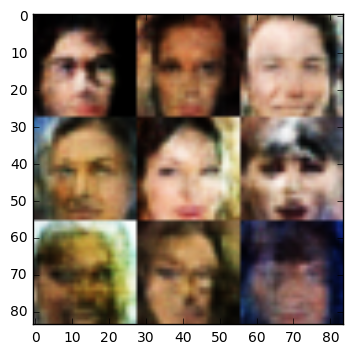

Step: 5410: Epoch 1/1... Discriminator Loss: 0.5787... Generator Loss: 1.8495
Step: 5420: Epoch 1/1... Discriminator Loss: 0.4741... Generator Loss: 3.2881
Step: 5430: Epoch 1/1... Discriminator Loss: 0.5148... Generator Loss: 2.2606
Step: 5440: Epoch 1/1... Discriminator Loss: 0.5745... Generator Loss: 4.1543
Step: 5450: Epoch 1/1... Discriminator Loss: 0.5229... Generator Loss: 2.0021
Step: 5460: Epoch 1/1... Discriminator Loss: 0.6826... Generator Loss: 1.3610
Step: 5470: Epoch 1/1... Discriminator Loss: 0.6577... Generator Loss: 1.5689
Step: 5480: Epoch 1/1... Discriminator Loss: 0.4745... Generator Loss: 2.2215
Step: 5490: Epoch 1/1... Discriminator Loss: 0.5705... Generator Loss: 1.8893
Step: 5500: Epoch 1/1... Discriminator Loss: 0.3898... Generator Loss: 3.2840


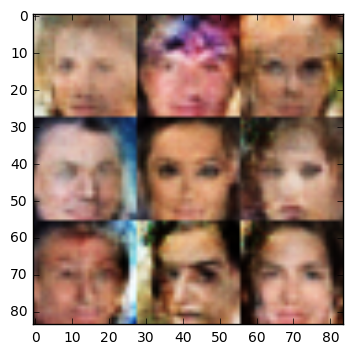

Step: 5510: Epoch 1/1... Discriminator Loss: 0.5539... Generator Loss: 1.8710
Step: 5520: Epoch 1/1... Discriminator Loss: 0.3613... Generator Loss: 4.3883
Step: 5530: Epoch 1/1... Discriminator Loss: 1.3283... Generator Loss: 0.6513
Step: 5540: Epoch 1/1... Discriminator Loss: 0.5717... Generator Loss: 2.6879
Step: 5550: Epoch 1/1... Discriminator Loss: 0.5312... Generator Loss: 2.0414
Step: 5560: Epoch 1/1... Discriminator Loss: 0.4676... Generator Loss: 3.8538
Step: 5570: Epoch 1/1... Discriminator Loss: 0.4101... Generator Loss: 3.5975
Step: 5580: Epoch 1/1... Discriminator Loss: 0.4840... Generator Loss: 4.1859
Step: 5590: Epoch 1/1... Discriminator Loss: 0.4055... Generator Loss: 3.4488
Step: 5600: Epoch 1/1... Discriminator Loss: 0.4428... Generator Loss: 2.6931


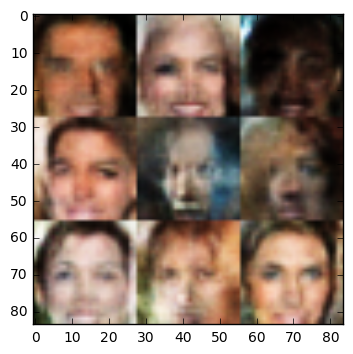

Step: 5610: Epoch 1/1... Discriminator Loss: 0.5983... Generator Loss: 1.9526
Step: 5620: Epoch 1/1... Discriminator Loss: 1.4673... Generator Loss: 0.5582
Step: 5630: Epoch 1/1... Discriminator Loss: 0.8337... Generator Loss: 3.7714
Step: 5640: Epoch 1/1... Discriminator Loss: 1.8882... Generator Loss: 4.7096
Step: 5650: Epoch 1/1... Discriminator Loss: 0.7567... Generator Loss: 1.2606
Step: 5660: Epoch 1/1... Discriminator Loss: 0.5790... Generator Loss: 1.9226
Step: 5670: Epoch 1/1... Discriminator Loss: 0.3978... Generator Loss: 4.4397
Step: 5680: Epoch 1/1... Discriminator Loss: 0.4618... Generator Loss: 2.4960
Step: 5690: Epoch 1/1... Discriminator Loss: 0.4810... Generator Loss: 2.2738
Step: 5700: Epoch 1/1... Discriminator Loss: 0.5404... Generator Loss: 2.0459


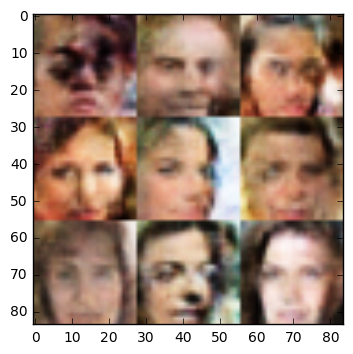

Step: 5710: Epoch 1/1... Discriminator Loss: 0.4804... Generator Loss: 2.2777
Step: 5720: Epoch 1/1... Discriminator Loss: 0.4619... Generator Loss: 2.4580
Step: 5730: Epoch 1/1... Discriminator Loss: 0.5138... Generator Loss: 2.0133
Step: 5740: Epoch 1/1... Discriminator Loss: 0.3903... Generator Loss: 4.5810
Step: 5750: Epoch 1/1... Discriminator Loss: 0.5856... Generator Loss: 1.8556
Step: 5760: Epoch 1/1... Discriminator Loss: 0.3633... Generator Loss: 3.8854
Step: 5770: Epoch 1/1... Discriminator Loss: 0.4701... Generator Loss: 2.4303
Step: 5780: Epoch 1/1... Discriminator Loss: 0.3902... Generator Loss: 3.8725
Step: 5790: Epoch 1/1... Discriminator Loss: 0.6995... Generator Loss: 1.4419
Step: 5800: Epoch 1/1... Discriminator Loss: 0.4870... Generator Loss: 2.1613


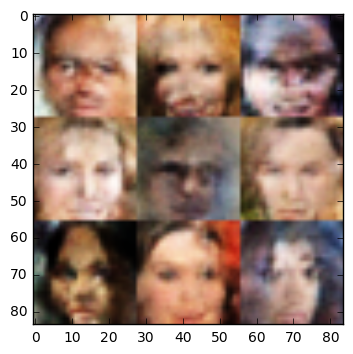

Step: 5810: Epoch 1/1... Discriminator Loss: 0.4046... Generator Loss: 3.6011
Step: 5820: Epoch 1/1... Discriminator Loss: 1.0207... Generator Loss: 0.9680
Step: 5830: Epoch 1/1... Discriminator Loss: 0.4791... Generator Loss: 2.2418
Step: 5840: Epoch 1/1... Discriminator Loss: 0.3937... Generator Loss: 3.7331
Step: 5850: Epoch 1/1... Discriminator Loss: 0.5928... Generator Loss: 1.6509
Step: 5860: Epoch 1/1... Discriminator Loss: 0.4766... Generator Loss: 2.4560
Step: 5870: Epoch 1/1... Discriminator Loss: 0.4383... Generator Loss: 3.3630
Step: 5880: Epoch 1/1... Discriminator Loss: 0.6518... Generator Loss: 1.5187
Step: 5890: Epoch 1/1... Discriminator Loss: 0.3669... Generator Loss: 3.7483
Step: 5900: Epoch 1/1... Discriminator Loss: 0.4028... Generator Loss: 3.1031


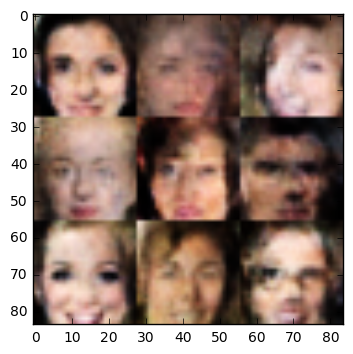

Step: 5910: Epoch 1/1... Discriminator Loss: 2.4982... Generator Loss: 0.1942
Step: 5920: Epoch 1/1... Discriminator Loss: 0.6504... Generator Loss: 1.5030
Step: 5930: Epoch 1/1... Discriminator Loss: 1.2263... Generator Loss: 0.6395
Step: 5940: Epoch 1/1... Discriminator Loss: 0.5073... Generator Loss: 2.1990
Step: 5950: Epoch 1/1... Discriminator Loss: 0.4280... Generator Loss: 3.7030
Step: 5960: Epoch 1/1... Discriminator Loss: 0.5244... Generator Loss: 1.9632
Step: 5970: Epoch 1/1... Discriminator Loss: 0.4817... Generator Loss: 2.3199
Step: 5980: Epoch 1/1... Discriminator Loss: 0.9040... Generator Loss: 1.1264
Step: 5990: Epoch 1/1... Discriminator Loss: 0.4518... Generator Loss: 2.6283
Step: 6000: Epoch 1/1... Discriminator Loss: 0.8039... Generator Loss: 1.0892


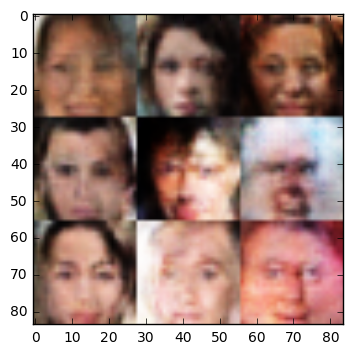

Step: 6010: Epoch 1/1... Discriminator Loss: 0.3641... Generator Loss: 3.9849
Step: 6020: Epoch 1/1... Discriminator Loss: 0.3989... Generator Loss: 3.2714
Step: 6030: Epoch 1/1... Discriminator Loss: 0.5351... Generator Loss: 2.0211
Step: 6040: Epoch 1/1... Discriminator Loss: 5.2197... Generator Loss: 8.1119
Step: 6050: Epoch 1/1... Discriminator Loss: 0.7203... Generator Loss: 1.3888
Step: 6060: Epoch 1/1... Discriminator Loss: 0.5080... Generator Loss: 2.9453
Step: 6070: Epoch 1/1... Discriminator Loss: 0.5664... Generator Loss: 2.1717
Step: 6080: Epoch 1/1... Discriminator Loss: 0.5094... Generator Loss: 2.2852
Step: 6090: Epoch 1/1... Discriminator Loss: 0.6633... Generator Loss: 1.5822
Step: 6100: Epoch 1/1... Discriminator Loss: 0.4311... Generator Loss: 2.8415


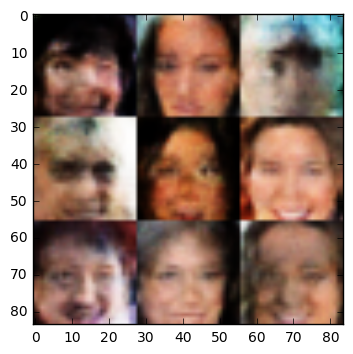

Step: 6110: Epoch 1/1... Discriminator Loss: 0.4565... Generator Loss: 2.5162
Step: 6120: Epoch 1/1... Discriminator Loss: 0.4790... Generator Loss: 2.1812
Step: 6130: Epoch 1/1... Discriminator Loss: 0.3572... Generator Loss: 4.9165
Step: 6140: Epoch 1/1... Discriminator Loss: 0.5668... Generator Loss: 1.8268
Step: 6150: Epoch 1/1... Discriminator Loss: 0.5917... Generator Loss: 1.5956
Step: 6160: Epoch 1/1... Discriminator Loss: 0.3647... Generator Loss: 4.2881
Step: 6170: Epoch 1/1... Discriminator Loss: 1.4690... Generator Loss: 4.0190
Step: 6180: Epoch 1/1... Discriminator Loss: 0.4017... Generator Loss: 3.7355
Step: 6190: Epoch 1/1... Discriminator Loss: 0.5576... Generator Loss: 1.9880
Step: 6200: Epoch 1/1... Discriminator Loss: 0.4365... Generator Loss: 2.7170


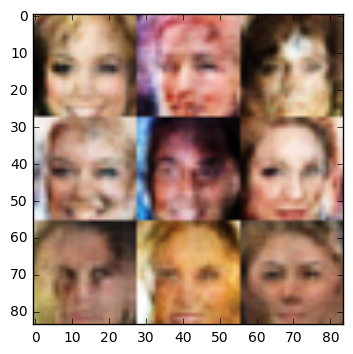

Step: 6210: Epoch 1/1... Discriminator Loss: 0.8013... Generator Loss: 1.1576
Step: 6220: Epoch 1/1... Discriminator Loss: 0.8844... Generator Loss: 1.1346
Step: 6230: Epoch 1/1... Discriminator Loss: 0.4607... Generator Loss: 2.6211
Step: 6240: Epoch 1/1... Discriminator Loss: 0.4030... Generator Loss: 3.2728
Step: 6250: Epoch 1/1... Discriminator Loss: 0.4902... Generator Loss: 2.2151
Step: 6260: Epoch 1/1... Discriminator Loss: 0.6766... Generator Loss: 1.5126
Step: 6270: Epoch 1/1... Discriminator Loss: 0.3926... Generator Loss: 3.5515
Step: 6280: Epoch 1/1... Discriminator Loss: 0.4347... Generator Loss: 2.6841
Step: 6290: Epoch 1/1... Discriminator Loss: 0.4192... Generator Loss: 2.8431
Step: 6300: Epoch 1/1... Discriminator Loss: 1.0818... Generator Loss: 0.8216


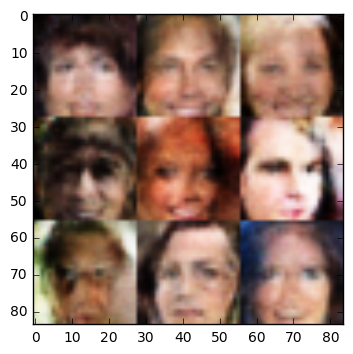

Step: 6310: Epoch 1/1... Discriminator Loss: 0.3543... Generator Loss: 4.8452
Step: 6320: Epoch 1/1... Discriminator Loss: 1.2763... Generator Loss: 0.7531
Step: 6330: Epoch 1/1... Discriminator Loss: 0.4564... Generator Loss: 2.8907
Finished with trainning


In [14]:
batch_size = 32
z_dim = 200
learning_rate = 0.0002
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)